# 𝕃𝕒𝕓#𝟜 - 𝔹𝕒𝕘𝕟𝕒𝕣𝕒, 𝔾𝕒𝕝𝕗𝕣𝕖̀, 𝕄𝕒𝕣𝕔𝕚𝕒𝕟𝕠̀
* Total running time: about 15 mins. We suggest you avoid running the code related to tasks 2 and 3. Task 1 and 4 are independent and can be separatly run.

## Table of Contents:
1. [Task #1](#task#1)
2. [Task #2](#task#2)
3. [Task #3](#task#3)
4. [Task #4](#task#4)

In [1]:
# importing libraries

import pandas as pd
import scipy
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import seaborn as sb
from tqdm.notebook import tqdm

import plotly.express as px
import plotly.figure_factory as ff

from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
import xgboost

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Task #1 : Basic manipulation and descriptive statistics <a name="task#1"></a>

## 1.1 Import the Data_PCLab4_Stock_Price.csv data and the Data_PCLab4_Stock_Volume.csv

In [2]:
# list of colors used in the graphs
c = ["lightgreen","forestgreen","darkcyan","darkturquoise","royalblue", "dodgerblue","mediumblue","navy"]

In [3]:
def import_df(file_name):
    """
    this function imports and preprocesses price and volume dataframes
    """
    data = pd.read_csv(file_name) # import
    data['Date'] = pd.to_datetime(data['Date']) # datetime formatting
    data.sort_values("Date",inplace=True) # sorting by date
    data.set_index('Date',inplace=True) # setting date as index
    return data

#### Prices dataframe

In [4]:
prices = import_df("data/lab4/Data_PCLab4_Stock_Price.csv")
prices.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-12,60.198570,75.510002,30.120001,12.13,175.929993,180.550003,28.250000,313.644379,1295.500000
2012-01-13,59.972858,74.599998,30.070000,12.35,178.419998,179.160004,22.790001,311.328064,1289.089966
2012-01-17,60.671429,75.239998,30.250000,12.25,181.660004,180.000000,26.600000,313.116364,1293.670044
2012-01-18,61.301430,75.059998,30.330000,12.73,189.440002,181.070007,26.809999,315.273285,1308.040039
2012-01-19,61.107143,75.559998,30.420000,12.80,194.449997,180.520004,26.760000,318.590851,1314.500000


In [5]:
print("Prices dataframe:")
print("rows (days):\t", prices.shape[0])
print("columns (stocks):", prices.shape[1])
print("starting date:\t",str(prices.index[0])[:10])
print("ending date:\t",str(prices.index[-1])[:10])
print("")
print("Info:")
print(prices.info())

Prices dataframe:
rows (days):	 2159
columns (stocks): 9
starting date:	 2012-01-12
ending date:	 2020-08-11

Info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2159 entries, 2012-01-12 to 2020-08-11
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AAPL    2159 non-null   float64
 1   BA      2159 non-null   float64
 2   T       2159 non-null   float64
 3   MGM     2159 non-null   float64
 4   AMZN    2159 non-null   float64
 5   IBM     2159 non-null   float64
 6   TSLA    2159 non-null   float64
 7   GOOG    2159 non-null   float64
 8   sp500   2159 non-null   float64
dtypes: float64(9)
memory usage: 168.7 KB
None


#### Volumes dataframe

In [6]:
volumes = import_df("data/lab4/Data_PCLab4_Stock_Volume.csv")
volumes.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-12,53146800,3934500,26511100,17891100,5385800,6881000,729300,3764400,4019890000
2012-01-13,56505400,4641100,22096800,16621800,4753500,5279200,5500400,4631800,3692370000
2012-01-17,60724300,3700100,23500200,15480800,5644500,6003400,4651600,3832800,4010490000
2012-01-18,69197800,4189500,22015000,18387600,7473500,4600600,1260200,5544000,4096160000
2012-01-19,65434600,5397300,25524000,14022900,7096000,8567200,1246300,12657800,4465890000


In [7]:
print("Volumes dataframe:")
print("rows (days):\t", volumes.shape[0])
print("columns (stocks):", volumes.shape[1])
print("starting date:\t",str(volumes.index[0])[:10])
print("ending date:\t",str(volumes.index[-1])[:10])
print("")
print("Info:")
print(volumes.info())

Volumes dataframe:
rows (days):	 2159
columns (stocks): 9
starting date:	 2012-01-12
ending date:	 2020-08-11

Info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2159 entries, 2012-01-12 to 2020-08-11
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   AAPL    2159 non-null   int64
 1   BA      2159 non-null   int64
 2   T       2159 non-null   int64
 3   MGM     2159 non-null   int64
 4   AMZN    2159 non-null   int64
 5   IBM     2159 non-null   int64
 6   TSLA    2159 non-null   int64
 7   GOOG    2159 non-null   int64
 8   sp500   2159 non-null   int64
dtypes: int64(9)
memory usage: 168.7 KB
None


## 1.2 <font color='#00807f'> Describe </font> the sample

The two provided datasets store data regarding daily prices and volumes for 8 stocks and the sp500 index.\
Both datasets range from 2012-01-12 to 2020-08-11 with a total of 2159 non null observation each.

### 1.2.1 What is the average trading volume for Apple stock ?

In [8]:
print("Average trading volume for AAPL:", np.round(volumes.mean()["AAPL"],2))

Average trading volume for AAPL: 58203317.42


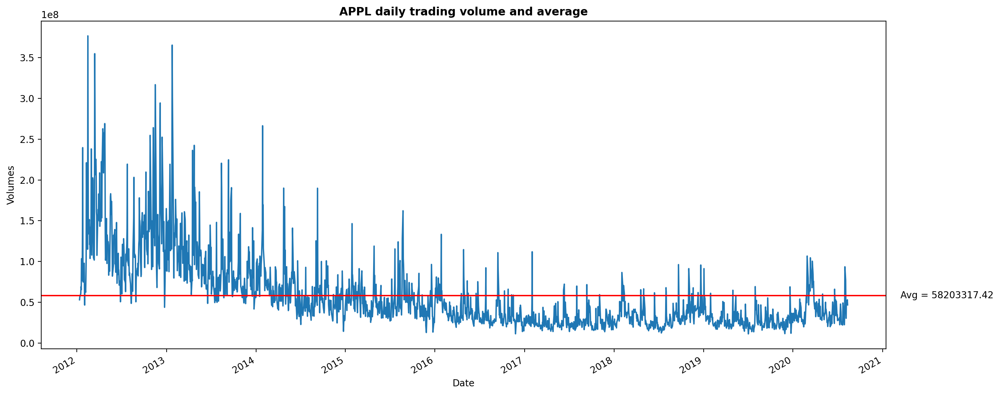

In [9]:
plt.figure(figsize =(15,6), dpi = 200)
volumes.AAPL.plot()
plt.ylabel("Volumes")
plt.title("APPL daily trading volume and average", weight = "bold")
plt.axhline(volumes.mean()["AAPL"], c = "red")
plt.text(18700,volumes.mean()["AAPL"], f'Avg = {np.round(volumes.mean()["AAPL"],2)}', va = "center")
plt.tight_layout()

### 1.2.2 What is the maximum trading volume for S&P500 ?

In [10]:
print("Maximum trading volume for S&P500 and relative date:")
top_sp = volumes[volumes["sp500"] == volumes.max()["sp500"]][["sp500"]].reset_index()
top_sp

Maximum trading volume for S&P500 and relative date:


,Date,sp500
0,2020-03-20,9044690000


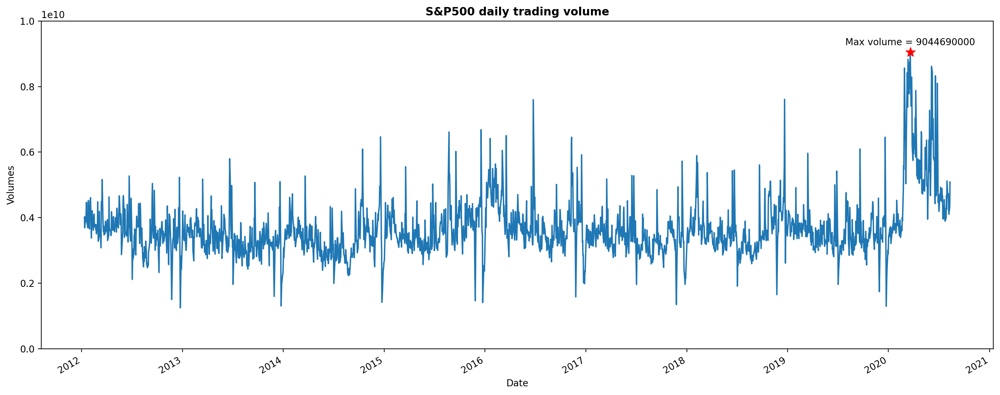

In [11]:
plt.figure(figsize =(15,6), dpi = 200)
volumes.sp500.plot()
plt.ylabel("Volumes")
plt.ylim(0,1e10)
plt.title("S&P500 daily trading volume", weight = "bold", zorder = -10)
plt.scatter(top_sp.Date[0], top_sp.sp500[0], c = "r", zorder = 10, s = 100, marker = "*")
plt.text(top_sp.Date[0], top_sp.sp500[0]+3e8, f"Max volume = {top_sp.sp500[0]}", va = "center", ha = "center")
plt.tight_layout()

The S&P500 reached the maximum trading volume on the 20th of March 2020, which might be connected to the spreading state of emergency among investors due to Coronavirus.

### 1.2.3 Which security is traded the most ? Comment on your answer

In [12]:
most_traded_sum = volumes.iloc[:,volumes.columns != "sp500"].sum().sort_values(ascending = False)
most_traded_sum

AAPL    125660962300
T        61145716000
MGM      21256610900
TSLA     15115811600
BA       13860598500
IBM       9614220300
AMZN      8857670800
GOOG      5393696400
dtype: int64

In [13]:
most_traded_mean = volumes.iloc[:,volumes.columns != "sp500"].mean().sort_values(ascending = False)
most_traded_mean

AAPL    5.820332e+07
T       2.832131e+07
MGM     9.845582e+06
TSLA    7.001302e+06
BA      6.419916e+06
IBM     4.453090e+06
AMZN    4.102673e+06
GOOG    2.498238e+06
dtype: float64

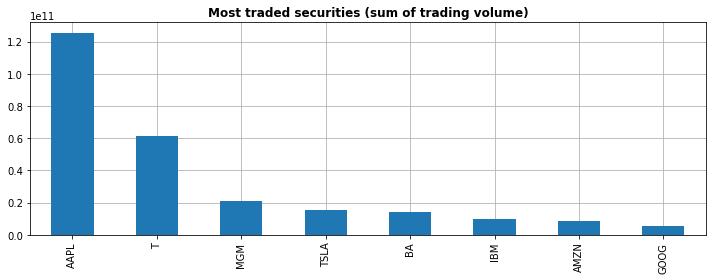

In [14]:
plt.figure(figsize = (10,4))
plt.title("Most traded securities (sum of trading volume)", weight = "bold")
most_traded_sum.plot.bar(zorder = 10)
plt.grid(zorder = -10)
plt.tight_layout()

Given we have made sure there are no null values in the dataset, either computing the sum or the mean of the volumes per each security gives us the same ranking, with AAPL as the most traded stock by quite a lot.

## 1.3 Plot the  <font color='#00807f'> time series of volumes </font> for all stocks (raw and normalized)

In [15]:
def plot_df(df,title="RAW STOCK PRICES (WITHOUT NORMALIZATION)",ylabel="Price",interactive=False):
    """
    this function plots the line plot of a given dataframe
    the function also receives as input a title, the y-axis label and interactive boolean parameter
    interactive = False -> matplotlib plot
    interactive = True -> plotly.express plot

    """
    if interactive == False:
        df.plot(figsize=(15,8))
        plt.title(title)
        plt.grid()
        plt.ylabel(ylabel);
        #plt.show()
    else:
        fig = px.line(df)
        fig.update_layout(
            title=title,
            yaxis_title=ylabel)
        fig.show()

In [16]:
def compute_returns(data):
    """
    this functions receives prices as input and computes the returns
    """
    df = pd.DataFrame(data = 0, columns=data.columns,index=data.index[1:])

    for i in range(len(data)-1):
        df.iloc[i] = (data.iloc[i+1] - data.iloc[i])/data.iloc[i]
      
    return df

In [17]:
def normalize_data(data,normalizing_date):
    """
    normalize the data setting to 1 the prices on a specified date
    """
    return data/data.loc[normalizing_date]

In [18]:
plot_df(volumes, interactive=True, title = "Time series of raw volumes")

Let's plot the normalized volumes to identify the differences between securities, as the S&P500 is on a whole different scale relatively to the stocks.

In [19]:
norm_volumes = normalize_data(volumes, "2012-01-12")
norm_volumes.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-12,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2012-01-13,1.063195,1.179591,0.833492,0.929054,0.882599,0.767214,7.542027,1.230422,0.918525
2012-01-17,1.142577,0.940424,0.886429,0.865279,1.048034,0.872460,6.378171,1.018170,0.997662
2012-01-18,1.302013,1.064811,0.830407,1.027751,1.387630,0.668595,1.727958,1.472745,1.018973
2012-01-19,1.231205,1.371788,0.962767,0.783792,1.317539,1.245052,1.708899,3.362501,1.110948


In [20]:
plot_df(norm_volumes, interactive=True, title = "Time series of normalized volumes")

Here it emerges clearly that although it was not the most traded stock overall, TSLA's volumes have experienced the biggest increase since the normalizing date (2012-01-12, beginning of the dataset). This is perfectly in line with the rise of the company to huge popularity, which in fact had only 1 model of vehicles available until 2012, and 4 new models have been presented since then.

In [21]:
# computing price daily changes
price_change = compute_returns(prices)
price_change.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-13,-0.003749,-0.012051,-0.001660,0.018137,0.014153,-0.007699,-0.193274,-0.007385,-0.004948
2012-01-17,0.011648,0.008579,0.005986,-0.008097,0.018159,0.004689,0.167179,0.005744,0.003553
2012-01-18,0.010384,-0.002392,0.002645,0.039184,0.042827,0.005944,0.007895,0.006889,0.011108
2012-01-19,-0.003169,0.006661,0.002967,0.005499,0.026446,-0.003038,-0.001865,0.010523,0.004939
2012-01-20,-0.017417,-0.000529,0.002959,-0.012500,-0.018102,0.044316,-0.005979,-0.083775,0.000669


In [22]:
# computing volume daily changes
volume_change = compute_returns(volumes)
volume_change.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2012-01-13,0.063195,0.179591,-0.166508,-0.070946,-0.117401,-0.232786,6.542027,0.230422,-0.081475
2012-01-17,0.074664,-0.202754,0.063511,-0.068645,0.187441,0.137180,-0.154316,-0.172503,0.086156
2012-01-18,0.139541,0.132267,-0.063199,0.187768,0.324032,-0.233668,-0.729082,0.446462,0.021361
2012-01-19,-0.054383,0.288292,0.159391,-0.237372,-0.050512,0.862192,-0.011030,1.283153,0.090263
2012-01-20,0.581634,-0.156560,0.036088,-0.069729,-0.209371,0.499872,-0.468587,0.677369,-0.123888


In [23]:
plot_df(volume_change, interactive = True, title = "Volume daily changes", ylabel = "Volume change")

In [24]:
volume_change.sort_values("GOOG", ascending = False).head(2)

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2014-04-03,-0.100192,0.125477,-0.095735,0.101200,0.429851,-0.169168,0.013114,33.664174,-0.024287
2014-04-02,-0.101311,-0.257438,-0.023872,-0.443542,0.243160,-0.087132,0.462721,17.620253,-0.061306


On the 3rd of April Google's stock split happened, when Class C stocks were created. These are shares that do not hold any voting rights at shareholder meeting and therefore sell at a discount. We can assume GOOG experienced a huge booost in volume in the days of the split as this led to a significant redistribution of the stocks.

## Is there a correlation between change in prices (returns) and change in volumes ?

In [25]:
corr_matrix = volume_change.corrwith(other=price_change, axis=0)
corr_matrix.sort_values()

T       -0.139598
AAPL    -0.114204
sp500   -0.102456
IBM     -0.081546
BA      -0.071670
GOOG    -0.024028
MGM      0.025558
TSLA     0.045621
AMZN     0.070281
dtype: float64

In the data above there are, for each of the 8 analyzed stocks, the correlation between the change in prices and change in volumes. There are no strong correlations: **T** stock features the strongest negative correlation, while only **MGM**, **TSLA** and **AMZN** show slight positive correlation.\
Let's visualize these correlation with the scatter plots below.

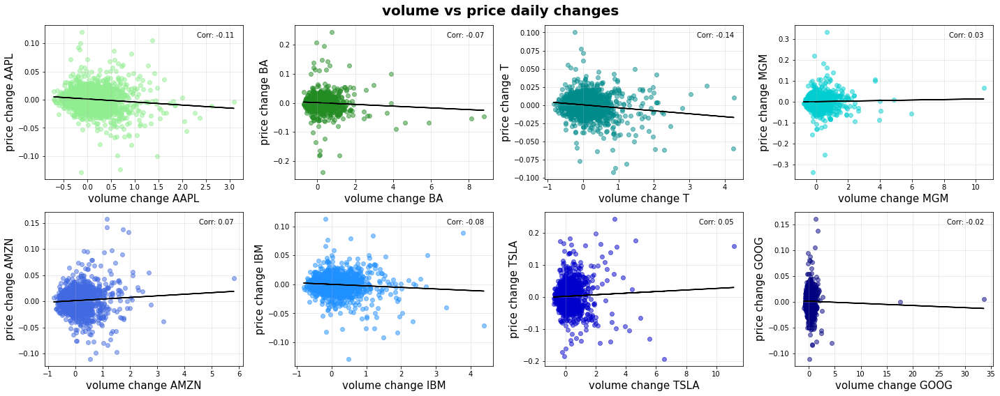

In [26]:
fig, ax = plt.subplots(nrows=2, ncols=4, figsize = (20,8))
fig.suptitle("volume vs price daily changes", fontsize = 20, weight = "bold")
axes = ax.flatten()
for i in range(len(axes)):
    axes[i].set_ylabel("price change "+price_change.columns[i], fontsize = 15)
    axes[i].set_xlabel("volume change "+price_change.columns[i], fontsize = 15)
    axes[i].scatter(volume_change.iloc[:,i], price_change.iloc[:,i], alpha = 0.5, c = c[i])
    axes[i].text(volume_change.iloc[:,i].max(),
                  price_change.iloc[:,i].max(),
                 f"Corr: {np.round(corr_matrix[i], 2)}", ha = "right", va = "top")
    
    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(volume_change.iloc[:,i], price_change.iloc[:,i], 1)

    #use red as color for regression line
    axes[i].plot(volume_change.iloc[:,i], m*volume_change.iloc[:,i]+b, color='k')
    axes[i].grid(alpha = 0.3)
plt.tight_layout()

An additional visualization about the correlations is the matrix below, showing cross correlation of price and volume changes of different stocks. On the main diagonal we find previous correlation for each of the 8 stocks

In [27]:
price_volumes_changes = pd.merge(price_change, volume_change, left_index= True, right_index=True, suffixes = ["_prices", "_volumes"])

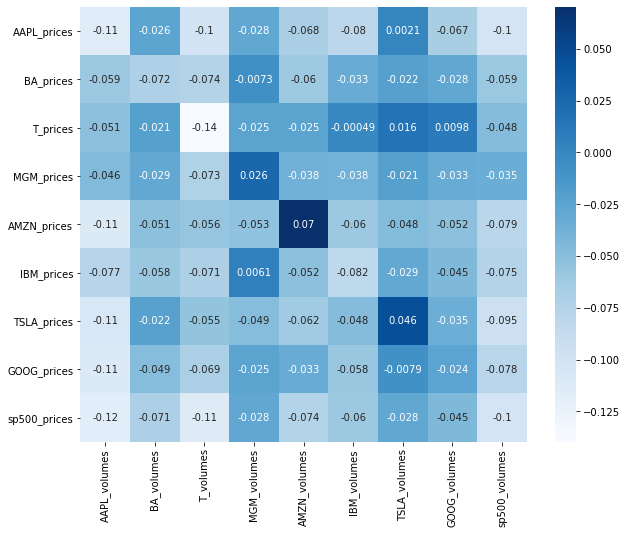

In [28]:
corr = price_volumes_changes.corr().iloc[:9, 9:] # computing the dataframe with the correlations
plt.figure(figsize=(10,8)) # creating the correlation heat-map
sb.heatmap(corr,cmap='Blues',annot=True);

From above heatmap we see that there are very poor cross correlation among the 8 stocks (almost all close to zero)

# Task #2 : Train and Test samples + Ridge regression <a name="task#2"></a>

## 2.1 Concatenate the date, stock price, and volume in one dataframe

In [29]:
# merging the prices and volumes dataframes in order to have all these values in one single dataframe
merged = pd.merge(prices, volumes, left_index= True, right_index=True, suffixes = ["_prices", "_volumes"])
# ordering the columns
prices_volumes = merged[np.sort(merged.columns)]
prices_volumes.head()

,AAPL_prices,AAPL_volumes,AMZN_prices,AMZN_volumes,BA_prices,BA_volumes,GOOG_prices,GOOG_volumes,IBM_prices,IBM_volumes,MGM_prices,MGM_volumes,TSLA_prices,TSLA_volumes,T_prices,T_volumes,sp500_prices,sp500_volumes
Date,,,,,,,,,,,,,,,,,,
2012-01-12,60.198570,53146800,175.929993,5385800,75.510002,3934500,313.644379,3764400,180.550003,6881000,12.13,17891100,28.250000,729300,30.120001,26511100,1295.500000,4019890000
2012-01-13,59.972858,56505400,178.419998,4753500,74.599998,4641100,311.328064,4631800,179.160004,5279200,12.35,16621800,22.790001,5500400,30.070000,22096800,1289.089966,3692370000
2012-01-17,60.671429,60724300,181.660004,5644500,75.239998,3700100,313.116364,3832800,180.000000,6003400,12.25,15480800,26.600000,4651600,30.250000,23500200,1293.670044,4010490000
2012-01-18,61.301430,69197800,189.440002,7473500,75.059998,4189500,315.273285,5544000,181.070007,4600600,12.73,18387600,26.809999,1260200,30.330000,22015000,1308.040039,4096160000
2012-01-19,61.107143,65434600,194.449997,7096000,75.559998,5397300,318.590851,12657800,180.520004,8567200,12.80,14022900,26.760000,1246300,30.420000,25524000,1314.500000,4465890000


## 2.2 Tip : scale the data
We use a MinMax Scaler, shrinking the data within the given range, in this case of 0.000001 to 1, in order to avoid division by zero.

In [30]:
sc = MinMaxScaler(feature_range = (0.000001, 1))
m = sc.fit_transform(merged)

In [31]:
# dataframed obtained scaling the data using the MinMax Scaler
prices_volumes_scaled = pd.DataFrame(m, columns=prices_volumes.columns, index = prices_volumes.index)
prices_volumes_scaled.head()

,AAPL_prices,AAPL_volumes,AMZN_prices,AMZN_volumes,BA_prices,BA_volumes,GOOG_prices,GOOG_volumes,IBM_prices,IBM_volumes,MGM_prices,MGM_volumes,TSLA_prices,TSLA_volumes,T_prices,T_volumes,sp500_prices,sp500_volumes
Date,,,,,,,,,,,,,,,,,,
2012-01-12,0.011027,0.022150,0.200600,0.161542,0.000001,0.708750,3.370930e-03,0.027259,0.008283,0.114427,0.030713,0.104393,0.190027,0.196063,0.194149,0.006017,0.150441,0.355443
2012-01-13,0.010463,0.019713,0.197606,0.168664,0.000818,0.697265,1.000000e-06,0.025464,0.005243,0.123625,0.037611,0.080940,0.175789,0.168542,0.139475,0.084782,0.185179,0.313430
2012-01-17,0.012210,0.021427,0.208384,0.165427,0.001880,0.704206,2.352544e-03,0.026850,0.007415,0.135178,0.028424,0.088396,0.162990,0.207324,0.164194,0.070769,0.153181,0.354237
2012-01-18,0.013786,0.020945,0.213174,0.180966,0.004432,0.713047,2.482156e-03,0.028522,0.014232,0.158382,0.033202,0.080506,0.195597,0.286932,0.116312,0.014781,0.221711,0.365226
2012-01-19,0.013300,0.022284,0.218564,0.183232,0.006075,0.708502,2.451297e-03,0.031094,0.017296,0.148077,0.044994,0.099149,0.146636,0.270501,0.251704,0.014552,0.506604,0.412653


## 2.3 You want to predict stock returns at t+1 using stock returns and volumes at t

The first model we use for predicting the stocks' prices is very basic, considering one lag value for price and one for volume. We will try this model for both Linear Regression and Ridge Regression. To fit our model we will use scaled prices, as obtained before with MinMaxScaler.

##  $P_{i,t+1} = f(P_{i,t}, V_{i,t})$

As a matter of feasibility, we will run all models in [task#2](task#2) and [task#3](task#3) only for the first stock of the DataFrame, i.e., for Apple (specified in the variable ```stock```). One can easily repeat the same procedure on all the other stocks available, just by changing the ```stock``` variable assignment in the cell below.

In [32]:
# stock that will be used in the models above
stock = "AAPL"

# creating dict to store results
score = {}

In [33]:
def build_lagged_df(stock, lag_price = 1, lag_volume = 0, lag_market = 0, df = prices_volumes_scaled, split = None):
    
    """
    this function creates a new dataframe from a dataframe with information about stocks' prices and volumes
    the function receives as inputs:
    - the stock that you want to use
    - the number of lags for prices, volumes, and market you want to have present in the final DataFrame
    - the split argument: you can specify whether you want to split data (frac. of splitting) or a single DataFrame (None)
    """
    
    lag_y = max(lag_price, lag_volume, lag_market)
    y = df.iloc[lag_y:, :][stock+"_prices"]
    X = pd.DataFrame()
    
    # obtaining the lag values for prices
    for i in range(1, lag_price+1):
        lagged_X = df.iloc[lag_y-i:-i, :][[stock+"_prices"]]
        lagged_X.columns = [stock+"_prices_lag"+str(i)]
        X = pd.concat([X.reset_index(drop = True), lagged_X.reset_index(drop = True)], axis = 1)
    
    # obtaining the lag values for volumes
    for i in range(1, lag_volume+1):
        lagged_X = df.iloc[lag_y-i:-i, :][[stock+"_volumes"]]
        lagged_X.columns = [stock+"_volumes_lag"+str(i)]
        X = pd.concat([X.reset_index(drop = True), lagged_X.reset_index(drop = True)], axis = 1)
    
    # obtaining the lag values for market
    for i in range(1, lag_market + 1):
        lagged_X = df.iloc[lag_y-i:-i, :][["sp500_prices"]]
        lagged_X.columns = ["sp500_prices_lag"+str(i)]
        X = pd.concat([X.reset_index(drop = True), lagged_X.reset_index(drop = True)], axis = 1)
        
    output = pd.concat([y.reset_index(), X], axis = 1).set_index("Date").rename({stock+"_prices":"y"}, axis = 1)
    if split:
        return train_test_split(output.iloc[:, 1:], output.y, test_size=split, shuffle=False)
    else:
        return output

In [34]:
def R_oos(true,predicted):
    """
    this function measures the out-of-sample R-squared, usually computed as (1-RSS/TSS)
    in this case, this metric is the one presented in Gu. et al paper, and the denominator is the sum of 
    squared excess returns without demeaning
    """
    true_r = np.array(true)
    predicted_r = np.array(predicted)
    res = 1 - (np.sum((true_r - predicted_r)**2)/np.sum((true_r**2)))
    return res

In [35]:
def sign_consistency(true, fitted):
    
    """
    this function measures the number of time the predicted fitted and the true return have the same sign
    """
    
    true = np.array(true)
    fitted = np.array(fitted)
    
    true_returns = (true[1:]-true[:-1])/true[:-1]
    fitted_returns = (fitted[1:]-fitted[:-1])/fitted[:-1]
    
    signs = [1 for i in range(len(true_returns)) if np.sign(true_returns)[i] == np.sign(fitted_returns)[i]]
    return sum(signs)/len(true_returns)

### 2.3.1 Linear Regression with 1 lagged price and 1 lagged volume

In [36]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=1, lag_volume=1, lag_market=0, df=prices_volumes_scaled , split = 0.25)
# fitting the model
model = LinearRegression().fit(X_train, y_train)
# train prediction
fit_train = model.predict(X_train)
#test prediction
fit_test = model.predict(X_test)
# performance measures
R2_test = R_oos(y_test, fit_test)
MSE_test = mean_squared_error(y_test, fit_test)
sc = sign_consistency(y_test, fit_test)
score["LinReg(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}
print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9990655496529693
MSE:		 0.0002178390789696476
correct sign:	 47.87%


In [37]:
# plotting the predicted vs the realized prices obtained with the Linear model
lr = pd.DataFrame(data = {"true":pd.concat([y_train, y_test]), "predicted":np.concatenate([fit_train, fit_test])})
plot_df(lr, ylabel = "Scaled prices",
        title = "Original Vs. Prediction - Linear regression (lag price = 1, lag volume = 1)", interactive=True)

In [38]:
print("Model coefficients for price and volume lags:",model.coef_)

Model coefficients for price and volume lags: [0.99588556 0.00195578]


As you can see from the plot above, the predicted prices seem to be very accurate, resulting in a very high R-squared. This can be explained by the fact that the price fluctuation is very low, and therefore the next day's price is predicted using the same-day price. Indeed, the value of the predicted parameter for the price lag is very close to one.

### 2.3.2 Ridge Regression with 1 lagged price and 1 lagged volume, and alpha parameter equal to 1

In [39]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=1, lag_volume=1, lag_market=0, df=prices_volumes_scaled, split=0.25)
# fitting the model
model = Ridge(alpha = 1).fit(X_train, y_train)
# train prediction
fit_train = model.predict(X_train)
# test prediction
fit_test = model.predict(X_test)
# performance measures
R2_test = R_oos(y_test, fit_test)
MSE_test = mean_squared_error(y_test, fit_test)
sc = sign_consistency(y_test, fit_test)
score["RidgeReg(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}
print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9734092518651513
MSE:		 0.006198835605568518
correct sign:	 46.38%


In [40]:
# plotting the predicted vs the realized prices obtained with the Ridge model
ridge = pd.DataFrame(data = {"true":pd.concat([y_train, y_test]), "predicted":np.concatenate([fit_train, fit_test])})
plot_df(ridge, ylabel = "Scaled prices",
        title = "Original Vs. Prediction - Ridge regression (lag price = 1, lag volume = 1)", interactive=True)

In [41]:
print("Model coefficients for price and volume lags:",model.coef_)

Model coefficients for price and volume lags: [0.71784652 0.1096396 ]


The coefficient associeted with the price lag is, in this case, a bit lower, probably due to Ridge regularization. 
For this reason and the ones explained before for the linear model, using a Ridge Regression makes the prediction performance worse. 

# Optional Task #2 bis : Improving the model ?

## 2bis.1 What about including the market (and being closer to the theory) ?
To further improve the model, we inclued the market lag as suggested (model below), and we run it again both for Linear and Ridge Regression.

## $ P_{i,t+1} = f(P_{i,t}, V_{i,t}, P_{M,t})$

### 2bis.1.1 Linear Regression with 1 lagged price and 1 lagged volume and including the market

In [42]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price = 1, lag_volume = 1, lag_market= 1,df=prices_volumes_scaled, split = 0.25)
# fitting the model
model = LinearRegression().fit(X_train, y_train)
# train prediction
fit_train = model.predict(X_train)
# test prediction
fit_test = model.predict(X_test)
# performance measures
R2_test = R_oos(y_test, fit_test)
MSE_test = mean_squared_error(y_test, fit_test)
sc = sign_consistency(y_test, fit_test)
score["LinReg(1,1,1)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}
print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9990634945552671
MSE:		 0.00021831816337695322
correct sign:	 47.87%


In [43]:
# plotting the predicted vs the realized prices obtained with the Linear model
lr_m = pd.DataFrame(data = {"true":pd.concat([y_train, y_test]), "predicted":np.concatenate([fit_train, fit_test])})
plot_df(lr_m, ylabel = "Scaled prices",
        title = "Original Vs. Prediction - Linear regression (lag price = 1, lag volume = 1, lag market = 1)", interactive=True)

In [44]:
print("Model coefficients for price, volume and market lags:",model.coef_)

Model coefficients for price, volume and market lags: [ 9.95534507e-01  1.97412631e-03 -6.37618351e-04]


The results obtained using also the market lag are quite similar to the ones before. Again the R2 is very high, and the MSE very low.

### 2bis.1.2 Ridge Regression with 1 lagged price and 1 lagged volume and including the market

In [45]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price = 1, lag_volume = 1, lag_market= 1,df=prices_volumes_scaled, split = 0.25)
# fitting the model
model = Ridge(alpha = 1).fit(X_train, y_train)
# train prediction
fit_train = model.predict(X_train)
# test prediction
fit_test = model.predict(X_test)
# performance measures
R2_test = R_oos(y_test, fit_test)
MSE_test = mean_squared_error(y_test, fit_test)
sc = sign_consistency(y_test, fit_test)
score["RidgeReg(1,1,1)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}
print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9706050210641153
MSE:		 0.006852557932128896
correct sign:	 46.75%


In [46]:
# plotting the predicted vs the realized prices obtained with the Ridge model
ridge_m = pd.DataFrame(data = {"true":pd.concat([y_train, y_test]), "predicted":np.concatenate([fit_train, fit_test])})
plot_df(ridge_m, ylabel = "Scaled prices",
        title = "Original Vs. Prediction - Ridge regression (lag price = 1, lag volume = 1, lag market = 1)", interactive=True)

In [47]:
print("Model coefficients for price, volume and market lags:",model.coef_)

Model coefficients for price, volume and market lags: [ 0.70216998  0.10834464 -0.03982584]


Again , Ridge regression seems to perform a little worse than the linear one, as can be seen both from the graph and from a slightly higher MSE and a slightly lower R2.

## 2bis.2 What about including more lags ?
Now we include 2 more price lags, obtaining the following model:
## $ P_{i,t+1} = f(P_{i,t}, V_{i,t}, P_{M,t}, P_{i,t-1}, P_{i,t-2})$

### 2bis.2.1 Linear Regression with 3 lagged price and 1 lagged volume, including the market

In [48]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price = 3, lag_volume = 1, lag_market= 1, split = 0.25)
# fitting the model
model = LinearRegression().fit(X_train, y_train)
# train prediction
fit_train = model.predict(X_train)
# test prediction
fit_test = model.predict(X_test)
# performance measures
R2_test = R_oos(y_test, fit_test)
MSE_test = mean_squared_error(y_test, fit_test)
sc = sign_consistency(y_test, fit_test)
score["LinReg(3,1,1)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}
print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9990409190425429
MSE:		 0.0002238055977023911
correct sign:	 48.33%


In [49]:
# plotting the predicted vs the realized prices obtained with the Linear model
lr_m = pd.DataFrame(data = {"true":pd.concat([y_train, y_test]), "predicted":np.concatenate([fit_train, fit_test])})
plot_df(lr_m, ylabel = "Scaled prices",
        title = "Original Vs. Prediction - Linear regression (lag price = 3, lag volume = 1, lag market = 1)", interactive=True)

In [50]:
print("Model coefficients for prices, volume and market lags:\n",model.coef_)

Model coefficients for prices, volume and market lags:
 [ 1.03728074e+00 -6.88581382e-02  2.70916529e-02  2.00753796e-03
 -5.59002341e-04]


Again, the predictions are really accurate. The results are quite similar in terms of R-squared and MSE, while there is a small improvement (about 1%) when it comes to sign-consistency measure.

### 2bis.2.2 Ridge Regression with 3 lagged price and 1 lagged volume, including the market

In [51]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price = 3, lag_volume = 1, lag_market= 1, split = 0.25)
# fitting the model
model = Ridge(alpha = 1).fit(X_train, y_train)
# train prediction
fit_train = model.predict(X_train)
# test prediction
fit_test = model.predict(X_test)
# performance measures
R2_test = R_oos(y_test, fit_test)
MSE_test = mean_squared_error(y_test, fit_test)
sc = sign_consistency(y_test, fit_test)
score["RidgeReg(3,1,1)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}
print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9928363280369435
MSE:		 0.0016716731501859926
correct sign:	 49.63%


In [52]:
# plotting the predicted vs the realized prices obtained with the Ridge model
ridge_m = pd.DataFrame(data = {"true":pd.concat([y_train, y_test]), "predicted":np.concatenate([fit_train, fit_test])})
plot_df(ridge_m, ylabel = "Scaled prices",
        title = "Original Vs. Prediction - Ridge regression (lag price = 3, lag volume = 1, lag market = 1)", interactive=True)

In [53]:
print("Model coefficients for prices, volume and market lags:\n",model.coef_)

Model coefficients for prices, volume and market lags:
 [ 0.30488262  0.28715278  0.2786741   0.04715187 -0.02030262]


Including more lags leads to improvement in all performance measures for Ridge regression. This can also be seen by the graph above, which shows for the first time very accurate Ridge predictions. It also achieves a sign-consistency of 49.63%, the best for the moment.

## 2bis.3 Lags and alphas ```cross-validation```
After trying all the models suggested in the PcLab, we decided to cross-validate all these parameters (price, volume, market lags, and alpha) in order to get the best possible model. This cross validation procedure is done without using the test dataset. We look for the best possible model, by looking its performance over the train and dev dataset, hoping that it will yield good results also on fresh new data (test dataset).

In [54]:
def cv_lag(stock, price_lags, volume_lags, market_lags, alphas = [0], k=5):
    
    """
    this function cross-validates different values of price, volume, market lags, alpha (taken as inputs) in order to find the best possible combination
    the function retuns a dataframe with all the parameters combination and the associated MSE
    """
    
    # dict to store results
    lag_cv_MSE = {}
    # KFold function provides train/test indices to split data in train/test sets into k folds
    kf = KFold(n_splits=k, shuffle=True, random_state=810)
    
    # looping over price lags
    for lag_p in tqdm(range(1,price_lags+1)):
        
        # looping over volume lags
        for lag_v in range(0, volume_lags+1):
            
            # looping over market lags
            for lag_m in range(0, market_lags + 1):
                
                # looping over alpha values
                for a in alphas:
                    
                    # building the lagged dataframe and split it in train and test (75%-25%)
                    X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price = lag_p, lag_volume = lag_v, lag_market = lag_m, split = 0.25)
                    kf.get_n_splits(X_train)
                    
                    # list to store th obtaind MSEs
                    MSE = []
                    
                    for train_index, test_index in kf.split(X_train):
                        
                        # splitting the train variables again to perform cross-validation
                        X_train_cv, X_test_cv = X_train.iloc[train_index], X_train.iloc[test_index]
                        y_train_cv, y_test_cv = y_train.iloc[train_index], y_train.iloc[test_index]
                        
                        # fitting the model
                        model = Ridge(a).fit(X_train_cv, y_train_cv)
                        # predicting
                        fitted = model.predict(X_test_cv)
                        MSE.append(mean_squared_error(y_test_cv, fitted))
                        
                    # the final MSE is the mean of all the MSE obtained in the different k folds  
                    cv_MSE = np.mean(MSE)
                    # storing results in the dict
                    lag_cv_MSE[(lag_p, lag_v, lag_m, a)] = cv_MSE

    # transforming the dict into a dataframe
    df = pd.DataFrame.from_dict(lag_cv_MSE, orient = "index", columns = ["MSE"])
    # sorting by MSE value
    df = df.sort_values("MSE", ascending = True).reset_index().rename({"index":"lags"}, axis = 1)
    # dividing the parameters in different columns
    df["lag_price"] = df["lags"].apply(lambda x: x[0])
    df["lag_volume"] = df["lags"].apply(lambda x: x[1])
    df["lag_market"] = df["lags"].apply(lambda x: x[2])
    df["ridge_alpha"] = df["lags"].apply(lambda x: x[3])
    
    return df[["lag_price", "lag_volume", "lag_market", "ridge_alpha", "MSE"]]

In [55]:
pd.set_option("display.precision", 8)
# cross-validating over 15 price lags, 10 volume lags, 10 market lags, and different values of alphas
best = cv_lag(stock, price_lags=15, volume_lags=10, alphas = np.linspace(0,0.1,4), market_lags=10)
# takes about 5 mins to run
best

  0%|          | 0/15 [00:00<?, ?it/s]

,lag_price,lag_volume,lag_market,ridge_alpha,MSE
0,10,3,0,0.0,0.00001690
1,2,7,0,0.0,0.00001692
2,2,3,0,0.0,0.00001692
3,10,3,1,0.0,0.00001693
4,2,8,0,0.0,0.00001694
...,...,...,...,...,...
7255,13,8,10,0.1,0.00002970
7256,15,10,9,0.1,0.00002970
7257,13,9,10,0.1,0.00002971
7258,15,10,10,0.1,0.00002972


The best model turned out to be the one with **10 prices lags**, **3 volumes lags**, **no market lag** and **0 as regularization parameter** (we are back to Linear Regression). This means that we are not using the market as predictor in our model and that constrain the parameters with Ridge leads to worse performance. In fact, all the best models have 0 as regularization parameter and 0 as market lag.

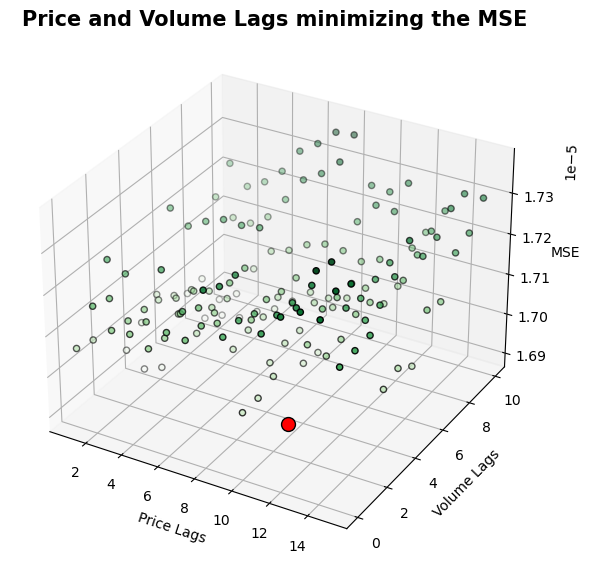

In [56]:
fig = plt.figure(figsize=(7,7),dpi=100)
ax = plt.axes(projection='3d')

# we select a new dataframe, keeping fixed alpha and mkt lag (boht to 0) in order to be able to plot in a 3D space
new_data = best[(best.ridge_alpha==0)&(best.lag_market==0)]

# Data for three-dimensional scattered points
zdata = new_data.MSE
xdata = new_data.lag_price
ydata = new_data.lag_volume

ax.scatter3D(xdata[0],ydata[0],zdata[0],c='r',s = 100,zorder=10,edgecolors='black')
ax.scatter3D(xdata[1:], ydata[1:], zdata[1:],zorder=-10,c=zdata[1:],cmap='Greens',edgecolors='black')
ax.set_xlabel('Price Lags')
ax.set_ylabel('Volume Lags')
ax.set_zlabel('MSE')
ax.set_title("Price and Volume Lags minimizing the MSE",weight='bold',fontsize=15);

The plot above represents the combination of price and volume lags which are minimizing the MSE (best combination in red). The other dots are colored for growing MSE.

In [57]:
# storing the best parameters obtained with cross-validation
best_lag_price = best.lag_price[0]
best_lag_volume = best.lag_volume[0]
best_lag_market = best.lag_market[0]
best_alpha = best.ridge_alpha[0]

best_lag_price, best_lag_volume, best_lag_market, best_alpha = 10, 3, 0, 0

### Best model prediction

In [58]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price = best_lag_price, lag_volume = best_lag_volume, lag_market= best_lag_market, split = 0.25)
# fitting the model
model = Ridge(alpha = best_alpha).fit(X_train, y_train)
# train prediction
fit_train = model.predict(X_train)
# test prediction
fit_test = model.predict(X_test)
# performance measures
R2_test = R_oos(y_test, fit_test)
MSE_test = mean_squared_error(y_test, fit_test)
sc = sign_consistency(y_test, fit_test)
score["BestReg(10,3,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}
print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9990712381227287
MSE:		 0.0002169517744333554
correct sign:	 48.04%


In [59]:
print("Best model coefficients:\n",model.coef_)

Best model coefficients:
 [ 1.0571647  -0.05156492 -0.00824223  0.04541904 -0.06451324  0.0095108
  0.04757936 -0.13127791  0.12009326 -0.02860198 -0.0279513  -0.03762113
  0.06787148]


In [60]:
results = pd.DataFrame.from_dict(score,orient='columns').T
# sorting results by MSE
results.sort_values('MSE')

,R2,MSE,Sign
"BestReg(10,3,0)",0.99907124,0.00021695,0.48044693
"LinReg(1,1,0)",0.99906555,0.00021784,0.47866419
"LinReg(1,1,1)",0.99906349,0.00021832,0.47866419
"LinReg(3,1,1)",0.99904092,0.00022381,0.48327138
"RidgeReg(3,1,1)",0.99283633,0.00167167,0.49628253
"RidgeReg(1,1,0)",0.97340925,0.00619884,0.46382189
"RidgeReg(1,1,1)",0.97060502,0.00685256,0.46753247


Numbers in the brackets represent the number of price, volume, and market lags respectively (i.e. LinReg(1,1,0): Linear Regression with 1 price lag, 1 volume lag, and 0 market lags).

The DataFrame above shows all the forecast accuracy performances over the test dataset with the different models so far. The best model (BestReg(10,3,0)) is indeed the most performing in terms of R2 and MSE, while not for the sign-consistency measure. However, all models seem to have excellent perfromance.
Interestingly, although the best model was tuned and cross validated on a validation set, in the end, it is the one that gets the lower MSE also on the test set.

# Task #3 : Same but with NN or Trees <a name="task#3"></a>

## 3.1 Pick one (or several)  <font color='#00807f'> machine learning model </font> : e.g., NN with many layers
In this Task we try more advanced models for all the settings explored before (different combination of price, volume, and market lags). At the end of this task, we will compare all the results obtained.

### 3.1.1 Neural Network
Firstly, we use Neural Network with one fully-connected layer, on which we will perform some parameters tuning.

In [61]:
np.random.seed(0)
# parameters to tune
sizeValues = range(3, 6)
regValues = np.linspace(start = 1e-3, stop = 1e-1, num = 10)

#### 3.1.1.1 Neural Network with 1 lagged price and 1 lagged volume
### $ P_{i,t+1} = f(P_{i,t}, V_{i,t})$

In [62]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=1,lag_volume=1, split=0.25)
# splitting again the train set to obtain a validation set on which to perform parameter tuning
X_CV_train, X_CV_val, y_CV_train, y_CV_val = train_test_split(X_train, y_train, test_size=0.25, shuffle=False)

In [63]:
nEpocs = 20 # for illustration purpose we take a limited number of epocs for parameter tuning
results = []

# looping over size values
for size in tqdm(sizeValues):
    # looping over regularization value
    for regularization in regValues:
        reg_model = tf.keras.Sequential([
            layers.Dense(units=size, kernel_regularizer=keras.regularizers.l2(regularization), kernel_initializer='normal', activation='relu',input_shape=[X_CV_train.shape[1]]),
            layers.Dense(1, kernel_initializer='normal')
              ])
        reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
        reg_model.fit(X_CV_train,y_CV_train, epochs=nEpocs)
        y_pred = reg_model.predict(X_CV_val)
        
        results.append({'Size': size, 'Regularization': regularization, 'MSE': mean_squared_error(y_pred,y_CV_val)})

  0%|          | 0/3 [00:00<?, ?it/s]

Epoch 1/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0077 - mean_squared_error: 0.0077
Epoch 2/20
38/38 [==============================] - 0s 923us/step - loss: 0.0031 - mean_squared_error: 0.0031
Epoch 3/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0023 - mean_squared_error: 0.0023
Epoch 4/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 5/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0021
Epoch 6/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0021 - mean_squared_error: 0.0020
Epoch 7/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0020 - mean_squared_error: 0.0019
Epoch 8/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0019 - mean_squared_error: 0.0018
Epoch 9/20
38/38 [==============================] - 0s 721us/step - loss: 0.0018 - mean_squared_error: 0.0016
Epoch 10/20
38/38 [=====

38/38 [==============================] - 0s 838us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 9/20
38/38 [==============================] - 0s 893us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 10/20
38/38 [==============================] - 0s 823us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 11/20
38/38 [==============================] - 0s 877us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 12/20
38/38 [==============================] - 0s 838us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 13/20
38/38 [==============================] - 0s 840us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 14/20
38/38 [==============================] - 0s 811us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 15/20
38/38 [==============================] - 0s 823us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 16/20
38/38 [==============================] - 0s 831us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 17/20
38

38/38 [==============================] - 0s 760us/step - loss: 0.0031 - mean_squared_error: 0.0030
Epoch 3/20
38/38 [==============================] - 0s 770us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 4/20
38/38 [==============================] - 0s 790us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 5/20
38/38 [==============================] - 0s 793us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 6/20
38/38 [==============================] - 0s 793us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 7/20
38/38 [==============================] - 0s 831us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 8/20
38/38 [==============================] - 0s 834us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 9/20
38/38 [==============================] - 0s 854us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 10/20
38/38 [==============================] - 0s 878us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 11/20
38/38 [=

38/38 [==============================] - 0s 845us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 11/20
38/38 [==============================] - 0s 875us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 12/20
38/38 [==============================] - 0s 902us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 13/20
38/38 [==============================] - 0s 871us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 14/20
38/38 [==============================] - 0s 885us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 15/20
38/38 [==============================] - 0s 839us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 16/20
38/38 [==============================] - 0s 880us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 17/20
38/38 [==============================] - 0s 846us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 18/20
38/38 [==============================] - 0s 899us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 19/20
3

38/38 [==============================] - 0s 1ms/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 18/20
38/38 [==============================] - 0s 973us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 19/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 20/20
38/38 [==============================] - 0s 936us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 1/20
38/38 [==============================] - 0s 858us/step - loss: 0.0088 - mean_squared_error: 0.0078
Epoch 2/20
38/38 [==============================] - 0s 884us/step - loss: 0.0041 - mean_squared_error: 0.0038
Epoch 3/20
38/38 [==============================] - 0s 979us/step - loss: 0.0027 - mean_squared_error: 0.0027
Epoch 4/20
38/38 [==============================] - 0s 903us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 5/20
38/38 [==============================] - 0s 952us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 6/20
38/38 [====

In [64]:
# best model -> lowest MSE
CV_table =  pd.DataFrame(results)
best_model_index = CV_table['MSE'].idxmin()
bestSize = CV_table['Size'][best_model_index]
bestReg = CV_table['Regularization'][best_model_index]

In [65]:
# fitting the neural network using the tuned parameters
nEpocs = 200
reg_model = tf.keras.Sequential([
    layers.Dense(units=bestSize, kernel_regularizer=keras.regularizers.l2(bestReg), kernel_initializer='normal', activation='relu',input_shape=[X_train.shape[1]]),
    layers.Dense(1, kernel_initializer='normal')
  ])
reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
reg_model.fit(X_train,y_train, epochs=nEpocs)

Epoch 1/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 2/200
51/51 [==============================] - 0s 831us/step - loss: 0.0087 - mean_squared_error: 0.0087
Epoch 3/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0058 - mean_squared_error: 0.0057
Epoch 4/200
51/51 [==============================] - 0s 876us/step - loss: 0.0051 - mean_squared_error: 0.0050
Epoch 5/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0047 - mean_squared_error: 0.0046
Epoch 6/200
51/51 [==============================] - 0s 987us/step - loss: 0.0042 - mean_squared_error: 0.0040
Epoch 7/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0036 - mean_squared_error: 0.0035
Epoch 8/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0031 - mean_squared_error: 0.0029
Epoch 9/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0026 - mean_squared_error: 0.0023
Epoch 10/200


51/51 [==============================] - 0s 939us/step - loss: 1.9272e-04 - mean_squared_error: 3.6189e-05
Epoch 140/200
51/51 [==============================] - 0s 979us/step - loss: 1.9001e-04 - mean_squared_error: 3.5281e-05
Epoch 141/200
51/51 [==============================] - 0s 908us/step - loss: 1.8877e-04 - mean_squared_error: 3.6236e-05
Epoch 142/200
51/51 [==============================] - 0s 910us/step - loss: 1.8762e-04 - mean_squared_error: 3.6470e-05
Epoch 143/200
51/51 [==============================] - 0s 860us/step - loss: 1.8535e-04 - mean_squared_error: 3.5612e-05
Epoch 144/200
51/51 [==============================] - 0s 968us/step - loss: 1.8304e-04 - mean_squared_error: 3.5183e-05
Epoch 145/200
51/51 [==============================] - 0s 931us/step - loss: 1.8556e-04 - mean_squared_error: 3.8990e-05
Epoch 146/200
51/51 [==============================] - 0s 899us/step - loss: 1.8036e-04 - mean_squared_error: 3.5467e-05
Epoch 147/200
51/51 [=========================

In [66]:
# predicting on the test using the tuned model
nn_pred = reg_model.predict(X_test).flatten()

# performance measures
R2_test = R_oos(y_test, nn_pred)
MSE_test = mean_squared_error(y_test, nn_pred)
sc = sign_consistency(y_test, nn_pred)
score["NN(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9976359332035111
MSE:		 0.0005511112871928809
correct sign:	 47.31%


---
#### 3.1.1.2 Neural Network with 1 lagged price and 1 lagged volume, including the market
### $ P_{i,t+1} = f(P_{i,t}, V_{i,t}, P_{M,t})$

In [67]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=1,lag_volume=1,lag_market=1, split=0.25)
# splitting again the train set to obtain a validation set on which to perform parameter tuning
X_CV_train, X_CV_val, y_CV_train, y_CV_val = train_test_split(X_train, y_train, test_size=0.25, shuffle=False)

In [68]:
nEpocs = 20 # for illustration purpose we take a limited number of epocs for parameter tuning
results = []
# looping over size values
for size in sizeValues:
    # looping over regularization value
    for regularization in regValues:
        reg_model = tf.keras.Sequential([
            layers.Dense(units=size, kernel_regularizer=keras.regularizers.l2(regularization), kernel_initializer='normal', activation='relu',input_shape=[X_CV_train.shape[1]]),
            layers.Dense(1, kernel_initializer='normal')
              ])
        reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
        reg_model.fit(X_CV_train,y_CV_train, epochs=nEpocs)
        y_pred = reg_model.predict(X_CV_val)
        
        results.append({'Size': size, 'Regularization': regularization, 'MSE': mean_squared_error(y_pred,y_CV_val)})

Epoch 1/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0083 - mean_squared_error: 0.0083
Epoch 2/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044
Epoch 3/20
38/38 [==============================] - 0s 856us/step - loss: 0.0030 - mean_squared_error: 0.0030
Epoch 4/20
38/38 [==============================] - 0s 962us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 5/20
38/38 [==============================] - 0s 860us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 6/20
38/38 [==============================] - 0s 983us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 7/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 8/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 9/20
38/38 [==============================] - 0s 598us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 10/20
38/38 

38/38 [==============================] - 0s 875us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 10/20
38/38 [==============================] - 0s 875us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 11/20
38/38 [==============================] - 0s 822us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 12/20
38/38 [==============================] - 0s 951us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 13/20
38/38 [==============================] - 0s 760us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 14/20
38/38 [==============================] - 0s 732us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 15/20
38/38 [==============================] - 0s 874us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 16/20
38/38 [==============================] - 0s 857us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 17/20
38/38 [==============================] - 0s 851us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 18/20
3

38/38 [==============================] - 0s 901us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 18/20
38/38 [==============================] - 0s 900us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 19/20
38/38 [==============================] - 0s 900us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 20/20
38/38 [==============================] - 0s 888us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 1/20
38/38 [==============================] - 0s 756us/step - loss: 0.0098 - mean_squared_error: 0.0079
Epoch 2/20
38/38 [==============================] - 0s 989us/step - loss: 0.0043 - mean_squared_error: 0.0036
Epoch 3/20
38/38 [==============================] - 0s 764us/step - loss: 0.0028 - mean_squared_error: 0.0026
Epoch 4/20
38/38 [==============================] - 0s 819us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 5/20
38/38 [==============================] - 0s 820us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 6/20
38/38 [

38/38 [==============================] - 0s 828us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 6/20
38/38 [==============================] - 0s 737us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 7/20
38/38 [==============================] - 0s 847us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 8/20
38/38 [==============================] - 0s 873us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 9/20
38/38 [==============================] - 0s 853us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 10/20
38/38 [==============================] - 0s 838us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 11/20
38/38 [==============================] - 0s 854us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 12/20
38/38 [==============================] - 0s 866us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 13/20
38/38 [==============================] - 0s 880us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 14/20
38/38

38/38 [==============================] - 0s 1ms/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 14/20
38/38 [==============================] - 0s 912us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 15/20
38/38 [==============================] - 0s 961us/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 16/20
38/38 [==============================] - 0s 750us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 17/20
38/38 [==============================] - 0s 926us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 18/20
38/38 [==============================] - 0s 916us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 19/20
38/38 [==============================] - 0s 886us/step - loss: 0.0026 - mean_squared_error: 0.0025
Epoch 20/20
38/38 [==============================] - 0s 913us/step - loss: 0.0026 - mean_squared_error: 0.0026


In [69]:
# best model -> lowest MSE
CV_table =  pd.DataFrame(results)
best_model_index = CV_table['MSE'].idxmin()
bestSize = CV_table['Size'][best_model_index]
bestReg = CV_table['Regularization'][best_model_index]

In [70]:
# fitting the neural network using the tuned parameters
nEpocs = 200
reg_model = tf.keras.Sequential([
    layers.Dense(units=bestSize, kernel_regularizer=keras.regularizers.l2(bestReg), kernel_initializer='normal', activation='relu',input_shape=[X_train.shape[1]]),
    layers.Dense(1, kernel_initializer='normal')
  ])
reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
reg_model.fit(X_train,y_train, epochs=nEpocs)

Epoch 1/200
51/51 [==============================] - 0s 988us/step - loss: 0.0173 - mean_squared_error: 0.0173
Epoch 2/200
51/51 [==============================] - 0s 698us/step - loss: 0.0075 - mean_squared_error: 0.0074
Epoch 3/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0052 - mean_squared_error: 0.0051
Epoch 4/200
51/51 [==============================] - 0s 886us/step - loss: 0.0042 - mean_squared_error: 0.0040
Epoch 5/200
51/51 [==============================] - 0s 839us/step - loss: 0.0033 - mean_squared_error: 0.0030
Epoch 6/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0024 - mean_squared_error: 0.0020
Epoch 7/200
51/51 [==============================] - 0s 919us/step - loss: 0.0018 - mean_squared_error: 0.0014
Epoch 8/200
51/51 [==============================] - 0s 978us/step - loss: 0.0015 - mean_squared_error: 9.9848e-04
Epoch 9/200
51/51 [==============================] - 0s 937us/step - loss: 0.0014 - mean_squared_error: 8.3110e-

51/51 [==============================] - 0s 845us/step - loss: 1.3441e-04 - mean_squared_error: 2.7535e-05
Epoch 139/200
51/51 [==============================] - 0s 840us/step - loss: 1.3325e-04 - mean_squared_error: 2.7568e-05
Epoch 140/200
51/51 [==============================] - 0s 849us/step - loss: 1.3076e-04 - mean_squared_error: 2.6613e-05
Epoch 141/200
51/51 [==============================] - 0s 801us/step - loss: 1.2995e-04 - mean_squared_error: 2.6797e-05
Epoch 142/200
51/51 [==============================] - 0s 844us/step - loss: 1.2826e-04 - mean_squared_error: 2.5848e-05
Epoch 143/200
51/51 [==============================] - 0s 851us/step - loss: 1.2752e-04 - mean_squared_error: 2.6409e-05
Epoch 144/200
51/51 [==============================] - 0s 836us/step - loss: 1.2771e-04 - mean_squared_error: 2.7958e-05
Epoch 145/200
51/51 [==============================] - 0s 810us/step - loss: 1.2726e-04 - mean_squared_error: 2.8456e-05
Epoch 146/200
51/51 [=========================

In [71]:
# predicting on the test using the tuned model
nn_pred = reg_model.predict(X_test).flatten()

# performance measures
R2_test = R_oos(y_test, nn_pred)
MSE_test = mean_squared_error(y_test, nn_pred)
sc = sign_consistency(y_test, nn_pred)
score["NN(1,1,1)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9980586854558637
MSE:		 0.0004525592757590935
correct sign:	 47.5%


-----
#### 3.1.1.3 Neural Network with 3 lagged prices and 1 lagged volume, including the market
### $ P_{i,t+1} = f(P_{i,t}, V_{i,t}, P_{M,t}, P_{i,t-1}, P_{i,t-2})$

In [72]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=3,lag_volume=1,lag_market=1, split=0.25)
# splitting again the train set to obtain a validation set on which to perform parameter tuning
X_CV_train, X_CV_val, y_CV_train, y_CV_val = train_test_split(X_train, y_train, test_size=0.25, shuffle=False)

In [73]:
nEpocs = 20 # for illustration purpose we take a limited number of epocs for parameter tuning
results = []
# looping over size values
for size in sizeValues:
    # looping over regularization value
    for regularization in regValues:
        reg_model = tf.keras.Sequential([
            layers.Dense(units=size, kernel_regularizer=keras.regularizers.l2(regularization), kernel_initializer='normal', activation='relu',input_shape=[X_CV_train.shape[1]]),
            layers.Dense(1, kernel_initializer='normal')
              ])
        reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
        reg_model.fit(X_CV_train,y_CV_train, epochs=nEpocs)
        y_pred = reg_model.predict(X_CV_val)
        
        results.append({'Size': size, 'Regularization': regularization, 'MSE': mean_squared_error(y_pred,y_CV_val)})

Epoch 1/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0084 - mean_squared_error: 0.0084
Epoch 2/20
38/38 [==============================] - 0s 846us/step - loss: 0.0045 - mean_squared_error: 0.0045
Epoch 3/20
38/38 [==============================] - 0s 563us/step - loss: 0.0030 - mean_squared_error: 0.0030
Epoch 4/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0026 - mean_squared_error: 0.0026
Epoch 5/20
38/38 [==============================] - 0s 821us/step - loss: 0.0023 - mean_squared_error: 0.0022
Epoch 6/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0019 - mean_squared_error: 0.0018
Epoch 7/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0016 - mean_squared_error: 0.0014
Epoch 8/20
38/38 [==============================] - 0s 617us/step - loss: 0.0013 - mean_squared_error: 0.0011
Epoch 9/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0011 - mean_squared_error: 9.0359e-04
Epoch 10/20
38/3

38/38 [==============================] - 0s 819us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 9/20
38/38 [==============================] - 0s 846us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 10/20
38/38 [==============================] - 0s 818us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 11/20
38/38 [==============================] - 0s 848us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 12/20
38/38 [==============================] - 0s 847us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 13/20
38/38 [==============================] - 0s 872us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 14/20
38/38 [==============================] - 0s 873us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 15/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 16/20
38/38 [==============================] - 0s 746us/step - loss: 0.0024 - mean_squared_error: 0.0022
Epoch 17/20
38/3

38/38 [==============================] - 0s 925us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 16/20
38/38 [==============================] - 0s 937us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 17/20
38/38 [==============================] - 0s 890us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 18/20
38/38 [==============================] - 0s 887us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 19/20
38/38 [==============================] - 0s 819us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 20/20
38/38 [==============================] - 0s 905us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 1/20
38/38 [==============================] - 0s 746us/step - loss: 0.0110 - mean_squared_error: 0.0081
Epoch 2/20
38/38 [==============================] - 0s 680us/step - loss: 0.0050 - mean_squared_error: 0.0037
Epoch 3/20
38/38 [==============================] - 0s 753us/step - loss: 0.0031 - mean_squared_error: 0.0026
Epoch 4/20
38/38

38/38 [==============================] - 0s 681us/step - loss: 0.0043 - mean_squared_error: 0.0038
Epoch 3/20
38/38 [==============================] - 0s 664us/step - loss: 0.0028 - mean_squared_error: 0.0026
Epoch 4/20
38/38 [==============================] - 0s 695us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 5/20
38/38 [==============================] - 0s 709us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 6/20
38/38 [==============================] - 0s 858us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 7/20
38/38 [==============================] - 0s 892us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 8/20
38/38 [==============================] - 0s 881us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 9/20
38/38 [==============================] - 0s 861us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 10/20
38/38 [==============================] - 0s 848us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 11/20
38/38 [=

38/38 [==============================] - 0s 874us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 11/20
38/38 [==============================] - 0s 900us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 12/20
38/38 [==============================] - 0s 849us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 13/20
38/38 [==============================] - 0s 845us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 14/20
38/38 [==============================] - 0s 906us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 15/20
38/38 [==============================] - 0s 918us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 16/20
38/38 [==============================] - 0s 953us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 17/20
38/38 [==============================] - 0s 928us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 18/20
38/38 [==============================] - 0s 998us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 19/20
3

In [74]:
# best model -> lowest MSE
CV_table =  pd.DataFrame(results)
best_model_index = CV_table['MSE'].idxmin()
bestSize = CV_table['Size'][best_model_index]
bestReg = CV_table['Regularization'][best_model_index]

In [75]:
# fitting the neural network using the tuned parameters
nEpocs = 200
reg_model = tf.keras.Sequential([
    layers.Dense(units=bestSize, kernel_regularizer=keras.regularizers.l2(bestReg), kernel_initializer='normal', activation='relu',input_shape=[X_train.shape[1]]),
    layers.Dense(1, kernel_initializer='normal')
  ])
reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
reg_model.fit(X_train,y_train, epochs=nEpocs)

Epoch 1/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0162 - mean_squared_error: 0.0161
Epoch 2/200
51/51 [==============================] - 0s 899us/step - loss: 0.0065 - mean_squared_error: 0.0064
Epoch 3/200
51/51 [==============================] - 0s 942us/step - loss: 0.0042 - mean_squared_error: 0.0041
Epoch 4/200
51/51 [==============================] - 0s 951us/step - loss: 0.0033 - mean_squared_error: 0.0031
Epoch 5/200
51/51 [==============================] - 0s 938us/step - loss: 0.0024 - mean_squared_error: 0.0022
Epoch 6/200
51/51 [==============================] - 0s 924us/step - loss: 0.0017 - mean_squared_error: 0.0014
Epoch 7/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0012 - mean_squared_error: 8.2853e-04
Epoch 8/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0010 - mean_squared_error: 5.4225e-04
Epoch 9/200
51/51 [==============================] - 0s 934us/step - loss: 8.9747e-04 - mean_squared_error: 4.

51/51 [==============================] - 0s 883us/step - loss: 9.9435e-05 - mean_squared_error: 3.1297e-05
Epoch 139/200
51/51 [==============================] - 0s 894us/step - loss: 9.9764e-05 - mean_squared_error: 3.2324e-05
Epoch 140/200
51/51 [==============================] - 0s 898us/step - loss: 9.8407e-05 - mean_squared_error: 3.1374e-05
Epoch 141/200
51/51 [==============================] - 0s 880us/step - loss: 9.5905e-05 - mean_squared_error: 2.9502e-05
Epoch 142/200
51/51 [==============================] - 0s 864us/step - loss: 9.5612e-05 - mean_squared_error: 3.0085e-05
Epoch 143/200
51/51 [==============================] - 0s 824us/step - loss: 9.6298e-05 - mean_squared_error: 3.1410e-05
Epoch 144/200
51/51 [==============================] - 0s 856us/step - loss: 9.6827e-05 - mean_squared_error: 3.2790e-05
Epoch 145/200
51/51 [==============================] - 0s 860us/step - loss: 9.5125e-05 - mean_squared_error: 3.1605e-05
Epoch 146/200
51/51 [=========================

In [76]:
# predicting on the test using the tuned model
nn_pred = reg_model.predict(X_test).flatten()

# performance measures
R2_test = R_oos(y_test, nn_pred)
MSE_test = mean_squared_error(y_test, nn_pred)
sc = sign_consistency(y_test, nn_pred)
score["NN(3,1,1)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.9980340092526412
MSE:		 0.0004587722557401503
correct sign:	 47.58%


---
#### 3.1.1.4 Neural Network with 10 lagged prices and 3 lagged volumes
### $ P_{i,t+1} = f(P_{i,t}, P_{i,t-1}, P_{i,t-2}, P_{i,t-3}, P_{i,t-4}, P_{i,t-5}, P_{i,t-6}, P_{i,t-7}, P_{i,t-8}, P_{i,t-9},V_{i,t},V_{i,t-1},V_{i,t-2})$

In [77]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=10,lag_volume=3, split=0.25)
# splitting again the train set to obtain a validation set on which to perform parameter tuning
X_CV_train, X_CV_val, y_CV_train, y_CV_val = train_test_split(X_train, y_train, test_size=0.25, shuffle=False)

In [78]:
nEpocs = 20 # for illustration purpose we take a limited number of epocs for parameter tuning
results = []
# looping over size values
for size in sizeValues:
    # looping over regularization value
    for regularization in regValues:
        reg_model = tf.keras.Sequential([
            layers.Dense(units=size, kernel_regularizer=keras.regularizers.l2(regularization), kernel_initializer='normal', activation='relu',input_shape=[X_CV_train.shape[1]]),
            layers.Dense(1, kernel_initializer='normal')
              ])
        reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
        reg_model.fit(X_CV_train,y_CV_train, epochs=nEpocs)
        y_pred = reg_model.predict(X_CV_val)
        
        results.append({'Size': size, 'Regularization': regularization, 'MSE': mean_squared_error(y_pred,y_CV_val)})

Epoch 1/20
38/38 [==============================] - 0s 889us/step - loss: 0.0084 - mean_squared_error: 0.0083
Epoch 2/20
38/38 [==============================] - 0s 847us/step - loss: 0.0038 - mean_squared_error: 0.0037
Epoch 3/20
38/38 [==============================] - 0s 792us/step - loss: 0.0021 - mean_squared_error: 0.0019
Epoch 4/20
38/38 [==============================] - 0s 847us/step - loss: 0.0019 - mean_squared_error: 0.0016
Epoch 5/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0017 - mean_squared_error: 0.0015
Epoch 6/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0015 - mean_squared_error: 0.0012
Epoch 7/20
38/38 [==============================] - 0s 993us/step - loss: 0.0013 - mean_squared_error: 0.0010
Epoch 8/20
38/38 [==============================] - 0s 914us/step - loss: 0.0012 - mean_squared_error: 8.1412e-04
Epoch 9/20
38/38 [==============================] - 0s 910us/step - loss: 0.0010 - mean_squared_error: 6.3467e-04
Epoch 

38/38 [==============================] - 0s 848us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 9/20
38/38 [==============================] - 0s 872us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 10/20
38/38 [==============================] - 0s 908us/step - loss: 0.0025 - mean_squared_error: 0.0025
Epoch 11/20
38/38 [==============================] - 0s 894us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 12/20
38/38 [==============================] - 0s 912us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 13/20
38/38 [==============================] - 0s 791us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 14/20
38/38 [==============================] - 0s 890us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 15/20
38/38 [==============================] - 0s 899us/step - loss: 0.0023 - mean_squared_error: 0.0021
Epoch 16/20
38/38 [==============================] - 0s 844us/step - loss: 0.0023 - mean_squared_error: 0.0021
Epoch 17/20
38

38/38 [==============================] - 0s 1ms/step - loss: 0.0023 - mean_squared_error: 0.0021
Epoch 16/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0023 - mean_squared_error: 0.0020
Epoch 17/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0020
Epoch 18/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0020
Epoch 19/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0019
Epoch 20/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0022 - mean_squared_error: 0.0019
Epoch 1/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0121 - mean_squared_error: 0.0076
Epoch 2/20
38/38 [==============================] - 0s 926us/step - loss: 0.0047 - mean_squared_error: 0.0033
Epoch 3/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0030 - mean_squared_error: 0.0024
Epoch 4/20
38/38 [==============

38/38 [==============================] - 0s 991us/step - loss: 0.0026 - mean_squared_error: 0.0023
Epoch 4/20
38/38 [==============================] - 0s 972us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 5/20
38/38 [==============================] - 0s 954us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 6/20
38/38 [==============================] - 0s 974us/step - loss: 0.0024 - mean_squared_error: 0.0023
Epoch 7/20
38/38 [==============================] - 0s 927us/step - loss: 0.0024 - mean_squared_error: 0.0022
Epoch 8/20
38/38 [==============================] - 0s 981us/step - loss: 0.0024 - mean_squared_error: 0.0022
Epoch 9/20
38/38 [==============================] - 0s 944us/step - loss: 0.0023 - mean_squared_error: 0.0022
Epoch 10/20
38/38 [==============================] - 0s 982us/step - loss: 0.0023 - mean_squared_error: 0.0021
Epoch 11/20
38/38 [==============================] - 0s 1ms/step - loss: 0.0023 - mean_squared_error: 0.0021
Epoch 12/20
38/38 [==

38/38 [==============================] - 0s 850us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 12/20
38/38 [==============================] - 0s 883us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 13/20
38/38 [==============================] - 0s 892us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 14/20
38/38 [==============================] - 0s 929us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 15/20
38/38 [==============================] - 0s 895us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 16/20
38/38 [==============================] - 0s 837us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 17/20
38/38 [==============================] - 0s 928us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 18/20
38/38 [==============================] - 0s 929us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 19/20
38/38 [==============================] - 0s 900us/step - loss: 0.0025 - mean_squared_error: 0.0024
Epoch 20/20
3

In [79]:
# best model -> lowest MSE
CV_table =  pd.DataFrame(results)
best_model_index = CV_table['MSE'].idxmin()
bestSize = CV_table['Size'][best_model_index]
bestReg = CV_table['Regularization'][best_model_index]

In [80]:
# fitting the neural network using the tuned parameters
nEpocs = 200
reg_model = tf.keras.Sequential([
    layers.Dense(units=bestSize, kernel_regularizer=keras.regularizers.l2(bestReg), kernel_initializer='normal', activation='relu',input_shape=[X_train.shape[1]]),
    layers.Dense(1, kernel_initializer='normal')
  ])
reg_model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mean_squared_error'])
reg_model.fit(X_train,y_train, epochs=nEpocs)

Epoch 1/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0185 - mean_squared_error: 0.0184
Epoch 2/200
51/51 [==============================] - 0s 617us/step - loss: 0.0063 - mean_squared_error: 0.0060
Epoch 3/200
51/51 [==============================] - 0s 1ms/step - loss: 0.0025 - mean_squared_error: 0.0021
Epoch 4/200
51/51 [==============================] - 0s 937us/step - loss: 0.0013 - mean_squared_error: 8.6878e-04
Epoch 5/200
51/51 [==============================] - 0s 981us/step - loss: 8.4006e-04 - mean_squared_error: 2.9301e-04
Epoch 6/200
51/51 [==============================] - 0s 940us/step - loss: 7.2960e-04 - mean_squared_error: 1.8214e-04
Epoch 7/200
51/51 [==============================] - 0s 965us/step - loss: 6.7388e-04 - mean_squared_error: 1.6143e-04
Epoch 8/200
51/51 [==============================] - 0s 950us/step - loss: 6.2345e-04 - mean_squared_error: 1.5180e-04
Epoch 9/200
51/51 [==============================] - 0s 1ms/step - loss: 5.7838e

51/51 [==============================] - 0s 945us/step - loss: 1.0219e-04 - mean_squared_error: 5.5871e-05
Epoch 138/200
51/51 [==============================] - 0s 879us/step - loss: 9.8750e-05 - mean_squared_error: 5.2780e-05
Epoch 139/200
51/51 [==============================] - 0s 920us/step - loss: 9.8182e-05 - mean_squared_error: 5.2323e-05
Epoch 140/200
51/51 [==============================] - 0s 944us/step - loss: 1.0737e-04 - mean_squared_error: 6.1695e-05
Epoch 141/200
51/51 [==============================] - 0s 903us/step - loss: 9.7892e-05 - mean_squared_error: 5.2091e-05
Epoch 142/200
51/51 [==============================] - 0s 909us/step - loss: 9.8871e-05 - mean_squared_error: 5.3292e-05
Epoch 143/200
51/51 [==============================] - 0s 957us/step - loss: 9.6009e-05 - mean_squared_error: 5.0732e-05
Epoch 144/200
51/51 [==============================] - 0s 1ms/step - loss: 9.7428e-05 - mean_squared_error: 5.2170e-05
Epoch 145/200
51/51 [===========================

In [81]:
# predicting on the test using the tuned model
nn_pred = reg_model.predict(X_test).flatten()

# performance measures
R2_test = R_oos(y_test, nn_pred)
MSE_test = mean_squared_error(y_test, nn_pred)
sc = sign_consistency(y_test, nn_pred)
score["NN(10,3,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.8908727425462716
MSE:		 0.025491304846824624
correct sign:	 52.14%


### 3.1.2 Random Forests
Then, we used Random Forests to do the same steps as before, trying different combinations of price, volume, market lags. Also in this case we performed some parameter tuning using GridSearchCV.

#### 3.1.2.1 Random Forest with 1 lagged price and 1 lagged volume
### $ P_{i,t+1} = f(P_{i,t}, V_{i,t})$

In [82]:
# parameters for tuning
p = {"n_estimators": [400], "max_depth" : [5, 10, 20]}

In [83]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=1,lag_volume=1, split=0.25)

In [84]:
# parameter tuning
forest = RandomForestRegressor(random_state = 0)
cvgrid = GridSearchCV(estimator=forest, param_grid=p, scoring='neg_mean_squared_error', verbose=10)
%time cvgrid.fit(X_train, y_train)
print("Best parameters:", cvgrid.best_params_)
print("Lowest error: ", -cvgrid.best_score_)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 1/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.5s
[CV 2/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 2/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.4s
[CV 3/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 3/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.7s
[CV 4/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 4/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.4s
[CV 5/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 5/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.005 total time=   0.4s
[CV 1/5; 2/3] START max_depth=10, n_estimators=400..............................
[CV 1/5; 2/3] END max_depth=10, n_estimators

In [85]:
# defining the best random forest model with parameters obtained with tuning
forest = RandomForestRegressor(n_estimators = 400, random_state = 0, max_depth = cvgrid.best_params_['max_depth'])
# fitting the model
forest.fit(X_train, y_train)
# test prediction
tuned_pred_forest = forest.predict(X_test)
# performance measures
R2_test = R_oos(y_test, tuned_pred_forest)
MSE_test = mean_squared_error(y_test, tuned_pred_forest)
sc = sign_consistency(y_test, tuned_pred_forest)
score["RF(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.8401678742819529
MSE:		 0.03726006755395756
correct sign:	 29.13%


---
#### 3.1.2.2 Random Forest with 1 lagged price and 1 lagged volume, including the market
### $ P_{i,t+1} = f(P_{i,t}, V_{i,t}, P_{M,t})$

In [86]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=1,lag_volume=1,lag_market=1, split=0.25)

In [87]:
# parameter tuning
forest = RandomForestRegressor(random_state = 0)
cvgrid = GridSearchCV(estimator=forest, param_grid=p, scoring='neg_mean_squared_error', verbose=10)
%time cvgrid.fit(X_train, y_train)
print("Best parameters:", cvgrid.best_params_)
print("Lowest error: ", -cvgrid.best_score_)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 1/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.5s
[CV 2/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 2/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.5s
[CV 3/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 3/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.5s
[CV 4/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 4/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.5s
[CV 5/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 5/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.005 total time=   0.5s
[CV 1/5; 2/3] START max_depth=10, n_estimators=400..............................
[CV 1/5; 2/3] END max_depth=10, n_estimators

In [88]:
# defining the best random forest model with parameters obtained with tuning
forest = RandomForestRegressor(n_estimators = 400, random_state = 0, max_depth = cvgrid.best_params_['max_depth'])
# fitting the model
forest.fit(X_train, y_train)
# test prediction
tuned_pred_forest = forest.predict(X_test)
# performance measures
R2_test = R_oos(y_test, tuned_pred_forest)
MSE_test = mean_squared_error(y_test, tuned_pred_forest)
sc = sign_consistency(y_test, tuned_pred_forest)
score["RF(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.8375574216255822
MSE:		 0.03786861631651586
correct sign:	 46.75%


-----
#### 3.1.2.3 Random Forest with 3 lagged prices and 1 lagged volume, including the market
### $ P_{i,t+1} = f(P_{i,t}, V_{i,t}, P_{M,t}, P_{i,t-1}, P_{i,t-2})$

In [89]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=3,lag_volume=1,lag_market=1, split=0.25)

In [90]:
# parameter tuning
forest = RandomForestRegressor(random_state = 0)
cvgrid = GridSearchCV(estimator=forest, param_grid=p, scoring='neg_mean_squared_error', verbose=10)
%time cvgrid.fit(X_train, y_train)
print("Best parameters:", cvgrid.best_params_)
print("Lowest error: ", -cvgrid.best_score_)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 1/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.7s
[CV 2/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 2/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.7s
[CV 3/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 3/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.7s
[CV 4/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 4/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   0.7s
[CV 5/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 5/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.005 total time=   0.7s
[CV 1/5; 2/3] START max_depth=10, n_estimators=400..............................
[CV 1/5; 2/3] END max_depth=10, n_estimators

In [91]:
# defining the best random forest model with parameters obtained with tuning
forest = RandomForestRegressor(n_estimators = 400, random_state = 0, max_depth = cvgrid.best_params_['max_depth'])
# fitting the model
forest.fit(X_train, y_train)
# test prediction
tuned_pred_forest = forest.predict(X_test)
# performance measures
R2_test = R_oos(y_test, tuned_pred_forest)
MSE_test = mean_squared_error(y_test, tuned_pred_forest)
sc = sign_consistency(y_test, tuned_pred_forest)
score["RF(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.8375887221043339
MSE:		 0.03789935858952222
correct sign:	 46.65%


---
#### 3.1.2.4 Random Forest with 10 lagged prices and 3 lagged volumes
### $ P_{i,t+1} = f(P_{i,t}, P_{i,t-1}, P_{i,t-2}, P_{i,t-3}, P_{i,t-4}, P_{i,t-5}, P_{i,t-6}, P_{i,t-7}, P_{i,t-8}, P_{i,t-9},V_{i,t},V_{i,t-1},V_{i,t-2})$

In [92]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=10,lag_volume=3, split=0.25)

In [93]:
# parameter tuning
forest = RandomForestRegressor(random_state = 0)
cvgrid = GridSearchCV(estimator=forest, param_grid=p, scoring='neg_mean_squared_error', verbose=10)
%time cvgrid.fit(X_train, y_train)
print("Best parameters:", cvgrid.best_params_)
print("Lowest error: ", -cvgrid.best_score_)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 1/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   1.3s
[CV 2/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 2/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   1.3s
[CV 3/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 3/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   1.3s
[CV 4/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 4/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.000 total time=   1.3s
[CV 5/5; 1/3] START max_depth=5, n_estimators=400...............................
[CV 5/5; 1/3] END max_depth=5, n_estimators=400;, score=-0.005 total time=   1.3s
[CV 1/5; 2/3] START max_depth=10, n_estimators=400..............................
[CV 1/5; 2/3] END max_depth=10, n_estimators

In [94]:
# defining the best random forest model with parameters obtained with tuning
forest = RandomForestRegressor(n_estimators = 400, random_state = 0, max_depth = cvgrid.best_params_['max_depth'])
# fitting the model
forest.fit(X_train, y_train)
# test prediction
tuned_pred_forest = forest.predict(X_test)
# performance measures
R2_test = R_oos(y_test, tuned_pred_forest)
MSE_test = mean_squared_error(y_test, tuned_pred_forest)
sc = sign_consistency(y_test, tuned_pred_forest)
score["RF(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.8347441746554519
MSE:		 0.038602515263958526
correct sign:	 31.66%


### 3.1.3 XGBoost
Lastly, we use XGBoost to see whether the performance can improve. In this case, we try with just one lag for price and one for volume. Again, we perform some parameter tuning with GridSearchCV for the learning rate and max_depth.

In [95]:
# parameters for tuning
p = {"learning_rate": [0.01,0.05, 0.03], "max_depth" : [ 10, 20,30]}

#### 3.1.3.1 XGBoost with 1 lagged price and 1 lagged volume
### $ P_{i,t+1} = f(P_{i,t}, V_{i,t})$

In [96]:
# building the lagged dataframe and split it in train and test (75%-25%)
X_train, X_test, y_train, y_test = build_lagged_df(stock, lag_price=1,lag_volume=1, split=0.25)

In [97]:
# parameter tuning
xgb = xgboost.XGBRegressor(random_state = 0) # you might need to 'pip install xgboost'
cvgrid = GridSearchCV(estimator=xgb, param_grid=p, scoring='neg_mean_squared_error', verbose=10)
%time cvgrid.fit(X_train, y_train)
print("Best parameters:", cvgrid.best_params_)
print("Lowest error: ", -cvgrid.best_score_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START learning_rate=0.01, max_depth=10............................
[CV 1/5; 1/9] END learning_rate=0.01, max_depth=10;, score=-0.027 total time=   0.1s
[CV 2/5; 1/9] START learning_rate=0.01, max_depth=10............................
[CV 2/5; 1/9] END learning_rate=0.01, max_depth=10;, score=-0.028 total time=   0.0s
[CV 3/5; 1/9] START learning_rate=0.01, max_depth=10............................
[CV 3/5; 1/9] END learning_rate=0.01, max_depth=10;, score=-0.016 total time=   0.1s
[CV 4/5; 1/9] START learning_rate=0.01, max_depth=10............................
[CV 4/5; 1/9] END learning_rate=0.01, max_depth=10;, score=-0.019 total time=   0.1s
[CV 5/5; 1/9] START learning_rate=0.01, max_depth=10............................
[CV 5/5; 1/9] END learning_rate=0.01, max_depth=10;, score=-0.002 total time=   0.1s
[CV 1/5; 2/9] START learning_rate=0.01, max_depth=20............................
[CV 1/5; 2/9] END learning_ra

In [98]:
# defining the best XGBoost model with parameters obtained with tuning
xgb = xgboost.XGBRegressor(random_state = 0, learning_rate = cvgrid.best_params_['learning_rate'], max_depth = cvgrid.best_params_['max_depth'])
# fitting the model
xgb.fit(X_train, y_train)
# test prediction
xgb_pred = xgb.predict(X_test)
# performance measures
R2_test = R_oos(y_test, xgb_pred)
MSE_test = mean_squared_error(y_test, xgb_pred)
sc = sign_consistency(y_test, xgb_pred)
score["XGB(1,1,0)"] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

print("R_oos:\t\t", R2_test)
print("MSE:\t\t", MSE_test)
print("correct sign:\t",str(np.round(sc*100, 2))+"%")

R_oos:		 0.8331623233343783
MSE:		 0.03889320169633761
correct sign:	 35.25%


## 3.2 Comment : <font color='#00807f'> which method performs the best ?  </font> Is it in line with Gu et al., (2020). Can we really <font color='#00807f'> compare </font> ?

In [99]:
results = pd.DataFrame.from_dict(score,orient='columns').T
# sorting the results by sign-consistency measure
results.sort_values('MSE')

,R2,MSE,Sign
"BestReg(10,3,0)",0.99907124,0.00021695,0.48044693
"LinReg(1,1,0)",0.99906555,0.00021784,0.47866419
"LinReg(1,1,1)",0.99906349,0.00021832,0.47866419
"LinReg(3,1,1)",0.99904092,0.00022381,0.48327138
"NN(1,1,1)",0.99805869,0.00045256,0.47495362
"NN(3,1,1)",0.99803401,0.00045877,0.47583643
"NN(1,1,0)",0.99763593,0.00055111,0.47309833
"RidgeReg(3,1,1)",0.99283633,0.00167167,0.49628253
"RidgeReg(1,1,0)",0.97340925,0.00619884,0.46382189
"RidgeReg(1,1,1)",0.97060502,0.00685256,0.46753247


Numbers in the brackets represent the number of price, volume, and market lags respectively (i.e. NN(10,3,0): Neural Network with 10 prices lags, 3 volumes lags, and 0 market lags).

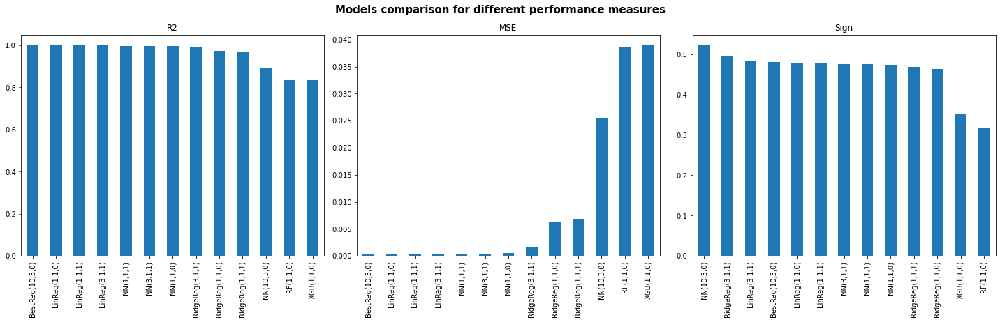

In [100]:
plt.figure(figsize = (20,6.5))
plt.suptitle('Models comparison for different performance measures',weight='bold',fontsize=15)
plt.subplot(1,3,1)
plt.title('R2')
results.R2.sort_values(ascending=False).plot.bar()

plt.subplot(1,3,2)
plt.title('MSE')
results.MSE.sort_values().plot.bar()

plt.subplot(1,3,3)
plt.title('Sign')
results.Sign.sort_values(ascending=False).plot.bar()

plt.tight_layout();

At the end,for two out of the three performance measures we used, the best model is the Linear one, with the parameters obtained from the cross-validation of the price, volume and market lags. Indeed, ```BestReg(10,3,0)``` shows the biggest R2 and the lowest MSE. In our case, both Random forests and XGBoost do not perform very well, for all the three metrics analysed. 

On the other hand, the NN get excellent results for MSE and R2, although slightly below those of the best model.
Also for the sign measure, ```NN(10,3,0)``` gets the highest value of all, being able to predict the returns as the same sign of the realized one for 52% of the times.

Given above results, we decide to use the ```BestReg(10,3,0)``` model for task 4.


Our results clearly diverge from the conclusions by Gu et al. (2020): the best predictive model in fact seems to be an OLS selecting price lags and volume lags as features. On the other hand, according to Gu et al. more advanced machine learning models such as random forests and neural networks are able to capture non linearities and interactions to forecast excess returns more efficiently. It is worth noting, however, that a few key differences between the 2 approaches exist. 
The first and more obvious one is data availability: Gu et al. ' s model is in fact trained on historical data for roughly 30000 stocks over 60 years, and examined a total of 900 baseline signals. Meanwhile, we exclusively considered price and volume lags for 8 stocks and the SP500 index over just 10 years of time, which is likely to explain at least in part the differences between the best performing models.
Secondly, Gu et al. focused on predicting excess returns whereas we targeted stock prices, which may rise an important question on what would be the most ideal variable of interest for investors.

# <font color='#cc4054'> Optional Task #4  </font> : Performance of the AI-driven portfolio <a name="task#4"></a>

## 4.1 Create a long portfolio by <font color='#00807f'> selecting every day the 4 assets with the highest predicted return at t+1 </font>  (i.e., you re-balance every day). You initially invest 100 \$, how much do you have at the end of the testing period ?

In [101]:
tickers = list(prices.columns[:-1]) #saving the 8 stocks' tickers

# preparing empty dictionaries and dataframes to store following results
score_tickers = {}
params = {}
forecasts = pd.DataFrame(columns=tickers)
realized = pd.DataFrame(columns=tickers)

In [102]:
# as stated before, we use BestReg(10,3,0) as the model to perform forecasts in task 4.
best_lag_price, best_lag_volume, best_lag_market, best_alpha = 10, 3, 0, 0

We now train the ```BestReg(10,3,0)``` model over the training data. We reapeat this process for each of the 8 stocks. Therefore we end up with a set of different estimated coefficients for each stock and we will coherentily use these coefficients to perform predictions.

In [103]:
for t in tickers:
    # building the dataframe and splitting it 
    X_train, X_test, y_train, y_test = build_lagged_df(t, lag_price=best_lag_price,lag_volume=best_lag_volume,
                                                       lag_market=best_lag_market, df=prices_volumes,split=0.25)
    model = Ridge(alpha = best_alpha).fit(X_train, y_train)
    # same as doing a linear reg
    fit_train = model.predict(X_train)
    fit_test = model.predict(X_test)
    forecasts[t] = fit_test
    realized[t] = y_test.reset_index(drop=True)
    
    params[t] = {"betas":model.coef_,"alpha":model.intercept_}
    R2_test = R_oos(y_test, fit_test)
    MSE_test = mean_squared_error(y_test, fit_test)
    sc = sign_consistency(y_test, fit_test)
    score_tickers[t] = {"R2":R2_test,"MSE":MSE_test,"Sign":sc}

C:\Users\artba\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning:

Ill-conditioned matrix (rcond=8.85938e-17): result may not be accurate.

C:\Users\artba\anaconda3\lib\site-packages\sklearn\linear_model\_ridge.py:157: LinAlgWarning:

Ill-conditioned matrix (rcond=8.09553e-17): result may not be accurate.



In [104]:
# dataframe with test performances of BestReg(10,3,0) over the 8 stocks
results_tickers = pd.DataFrame.from_dict(score_tickers,orient='columns').T
results_tickers.sort_values('Sign',ascending=False)

,R2,MSE,Sign
AMZN,0.99955315,1747.13202822,0.51955307
MGM,0.99914930,0.59428915,0.50837989
BA,0.99933653,70.54871542,0.50465549
AAPL,0.99944610,33.68680606,0.49162011
GOOG,0.99961467,590.57997828,0.49162011
TSLA,0.99758471,732.82011878,0.47672253
T,0.99967775,0.35355551,0.47113594
IBM,0.99965204,6.26031232,0.46741155


In [105]:
# computing predicted and realized returns of the test dataset
realized_returns = compute_returns(prices.loc[X_test.index,:])
predicted_returns = (forecasts.iloc[1:,:].reset_index(drop=True) - realized.iloc[:-1,:].reset_index(drop=True))/realized.iloc[:-1,:].reset_index(drop=True)

For this task, we have built the ```AI_driven_pf``` function. It produces an AI driven portfolio and returns the series of the evolution over the test time horizon of an initial capital invested.
Its functioning is the following: for every day, at time t, it forecasts t+1 stock returns. Depending on this prediction it selects the best performing stocks (out of the 8 stocks available) and builds a porfolio with those most appealing stocks. The number of stocks to be selected can be specified by the user with the ```top_n``` parameter (from 1 to 8). Once the best stocks are selected, the function finds the weights (either equally weighting the top_n stocks or proportional to ```top_n``` expected returns) for the rebalanced allocation. The function also lets the user to specify wheter shorting is allowed or not.
Finally, the user can also specify a transaction fee. If a fee is specified, at every time step the ```AI_driven_pf``` function produces the optimal rebalanced weights, but it evalutes if the change in the asset allocation strategy is worthy according to the return expectations considering the additional fees. If it is not, then no changes in the portfolio strategy are made.

In [106]:
def AI_driven_pf(top_n, weighted = True, predicted_returns = predicted_returns, realized_returns = realized_returns,
                 value = 100, fees = 0.0, shorting = True):
    """
    this function builds and AI driven portfolio and returns the array of realized daily returns of the pf
    every day it selects the top_n stocks out of the 8 availables
    the user can choose between
        - an equally weighted portfolio among the daily top_n stocks
        - use weights proportional to the expected returns of the top_n stocks
    Moreover, the user can specify if shorting is allowed or not (shorting = True/False)
    Finally, also a fee can be specified 
    """
    realized_returns = realized_returns.copy()
    predicted_returns = predicted_returns.copy()
    
    value_time_series = [value] # where I will store the series of the AI-driven pf capital
    best_tickers = [] # initialize empty stocks I own
    weights = np.zeros(8) # initialize weight vector of zeros (assuming no portfolio held at the beginning)
    
    for i in range(len(predicted_returns)):
        
        curr_weights = weights # save current weight vector 
        best_tickers = predicted_returns.loc[i].sort_values(ascending = False)[:top_n]
        best_tickers = list(best_tickers.index) # identify top_n tickers
        best_pred_ret = predicted_returns.loc[i].copy() # find expected returns
        best_pred_ret[~best_pred_ret.index.isin(best_tickers)] = 0 # invest only in best stocks
        
        if weighted:
            weights = np.array(best_pred_ret)/np.sum(best_pred_ret) # create weights proportional to the returns
        else:
            weights = np.ones(len(best_pred_ret)) / top_n
            weights[~best_pred_ret.index.isin(best_tickers)] = 0 # create equal weights for best stocks
               
        if shorting == False:
            weights[best_pred_ret < 0] = 0 # to avoid shorting
            weights[best_pred_ret > 0] /= np.sum(weights[best_pred_ret > 0]) # re-normalize
            
        fees_to_pay = 0  # initialize fees to pay  
        if fees > 0:
            w_change = weights - curr_weights # retrieve changes in weights 
            w_change = w_change[w_change>0] # retrieve positive changes only (transaction fees only on purchases)
            fees_to_pay = np.sum(w_change) * value * fees # total fees to pay given new investments

            Er_new_w = np.dot(weights, best_pred_ret) # compute expected return of updated portfolio weights
            Ev_new_w = value * (1 + Er_new_w) - fees_to_pay # compute expected new value given predicted returns and fees

            Er_curr_w = np.dot(curr_weights, predicted_returns.loc[i]) # compute expected return with current portfolio weights
            Ev_curr_w = value * (1 + Er_curr_w) # compute expected new value given current portfolio weights and no fees
        
            # evaluate if change in portfolio weights (from curr_weights to weights) is expected to be worth it
            if Ev_new_w <= Ev_curr_w: # if it is not, keep yesterday's weights and no fee charged
                weights = curr_weights
                fees_to_pay = 0
            
        ret = np.dot(weights, realized_returns.iloc[i,:-1]) # compute realized return of my portfolio
        value = ( (1 + ret) * value ) - fees_to_pay # update capital invested deducted of possible fees
        value_time_series.append(value) # append value to the time series
        
    return value_time_series 

As a first step we build two AI driven portfolios. Both of then find every day the top 4 stocks to invest on, but the first portfolio uses equal weights on the 4 stocks and allows for shorting, while the second one produces weights proportional to the expected returns of the top 4 stocks and shorting is not allowed.

In [107]:
value_time_series_no_w = AI_driven_pf(4, weighted = False) # realized returns of the first portfolio
value_time_series_w = AI_driven_pf(4, weighted = True, shorting = False) # realized returns of the second portolio

In [108]:
# building two array of green / red colors so that we can easily visualize when
# the portfolio current value exceedes the initial investment (Vo = 100)
colors_no_w =['red' if x < 100 else 'green' for x in np.array(value_time_series_no_w)]
colors_w =['red' if x < 100 else 'green' for x in np.array(value_time_series_w)]

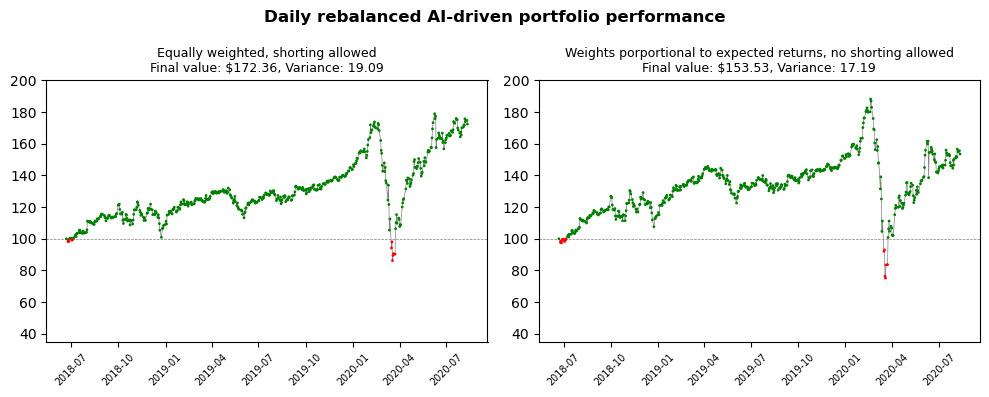

In [109]:
# plotting results

plt.figure(figsize=(10,4),dpi=100)
plt.suptitle("Daily rebalanced AI-driven portfolio performance", weight = "bold")
plt.subplot(1,2,1)
plt.title(f"Equally weighted, shorting allowed\nFinal value: ${np.round(value_time_series_no_w[-1],2)}, Variance: {np.round(np.std(value_time_series_no_w),2)}", size = 9)
plt.plot(X_test.index,value_time_series_no_w,color='grey',lw=0.5, zorder = -10)
plt.scatter(X_test.index,value_time_series_no_w,color=colors_no_w,s=1, label = "no weight", zorder = 10)

plt.axhline(100,lw=0.5,color='grey',zorder=-100,ls='dashed')
plt.ylim(35,200)
plt.xticks(rotation = 45,size=7)

plt.subplot(1,2,2)
plt.title(f"Weights porportional to expected returns, no shorting allowed\nFinal value: ${np.round(value_time_series_w[-1],2)}, Variance: {np.round(np.std(value_time_series_w),2)}", size = 9)
plt.plot(X_test.index,value_time_series_w,color='grey',lw=0.5, zorder = -10)
plt.scatter(X_test.index,value_time_series_w,color=colors_w,s=1, label = "weight", zorder = 10)
plt.axhline(100,lw=0.5,color='grey',zorder=-100,ls='dashed')
plt.ylim(35,200)
plt.xticks(rotation = 45,size=7)
plt.tight_layout();

The two portfolios show a similar behaviour. However the one on the left features a higher portfolio value and a higher value variance, probably due to the fact that we are allowing shorting strategies (that are riskier). Red dots appear when portfolio value is lower than initial investment ($ 100).

We now build the same two portfolios as above (equally weighted and shorting allowed - proportionally weighted and no shorting allowed) but this time we change the number of stocks (ranging from 1 to 8) to be selected at every time step as the best ones.

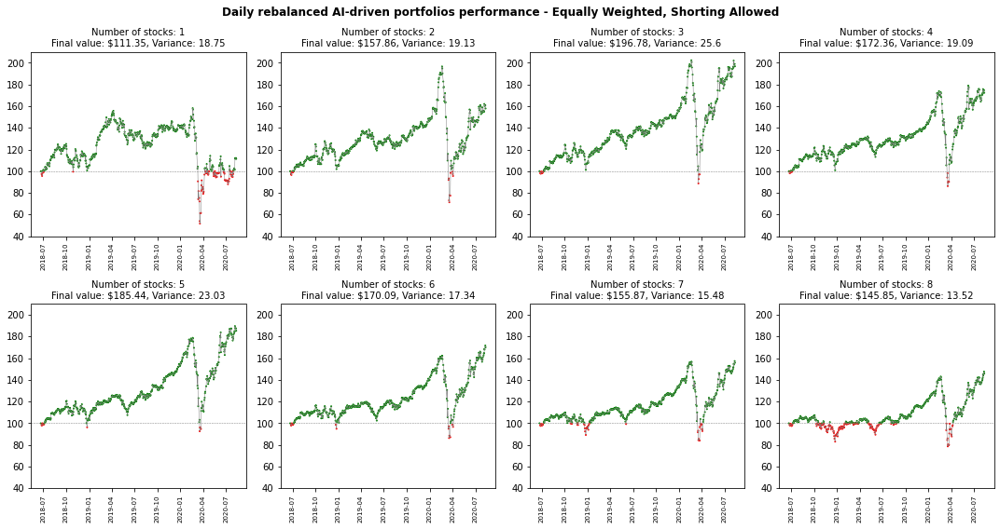

In [110]:
d_top = {}
colors_top = []

for top_n in range(1,9): # ranging across possibile n_top
    value = 100
    rets = []
    value_time_series = []
    value_time_series = AI_driven_pf(top_n, weighted = False) 
    
    colors_top.append(['red' if x < 100 else 'green' for x in np.array(value_time_series)])
    d_top[top_n] = value_time_series

plt.figure(figsize=(15,8))
plt.suptitle("Daily rebalanced AI-driven portfolios performance - Equally Weighted, Shorting Allowed", weight = "bold")
for i in range(1,len(tickers)+1):
    plt.subplot(2,4,i)
    value_time_series = d_top[i]
    plt.plot(X_test.index,value_time_series,color='grey',lw=0.5)
    plt.xticks(rotation = "vertical",size=7)
    plt.scatter(X_test.index,value_time_series,color=colors_top[i-1],s=1)
    plt.axhline(100,lw=0.5,color='grey',zorder=-100,ls='dashed')
    plt.title(f"Number of stocks: {i}\nFinal value: ${np.round(value_time_series[-1],2)}, Variance: {np.round(np.std(value_time_series),2)}", fontsize = 10)
    plt.ylim(40,210)
    
plt.tight_layout()

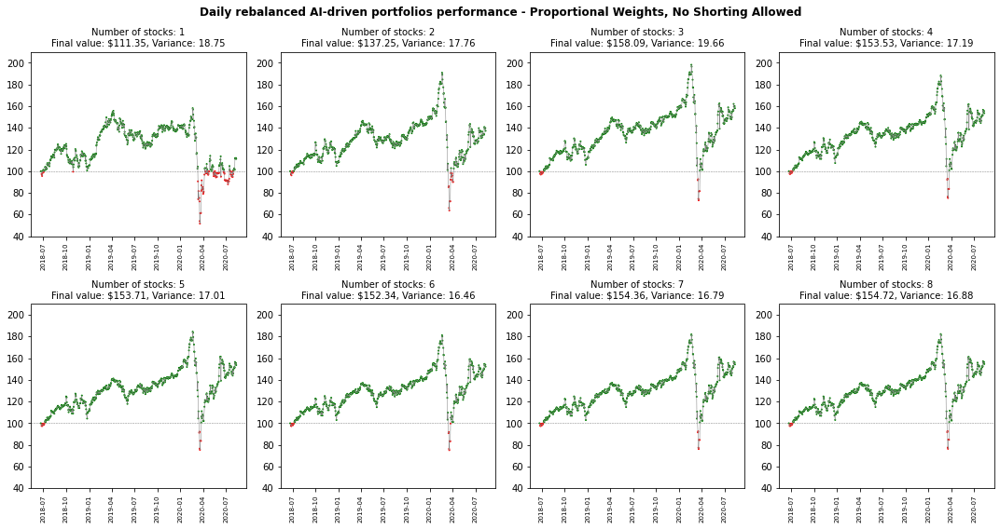

In [111]:
d_top = {}
colors_top = []

for top_n in range(1,9):
    value = 100
    rets = []
    value_time_series = []
    value_time_series = AI_driven_pf(top_n, weighted = True, shorting = False)
    
    colors_top.append(['red' if x < 100 else 'green' for x in np.array(value_time_series)])
    d_top[top_n] = value_time_series

plt.figure(figsize=(15,8))
plt.suptitle("Daily rebalanced AI-driven portfolios performance - Proportional Weights, No Shorting Allowed", weight = "bold")
for i in range(1,len(tickers)+1):
    plt.subplot(2,4,i)
    value_time_series = d_top[i]
    plt.plot(X_test.index,value_time_series,color='grey',lw=0.5)
    plt.xticks(rotation = "vertical",size=7)
    plt.scatter(X_test.index,value_time_series,color=colors_top[i-1],s=1)
    plt.axhline(100,lw=0.5,color='grey',zorder=-100,ls='dashed')
    plt.ylim(40,210)
    plt.title(f"Number of stocks: {i}\nFinal value: ${np.round(value_time_series[-1],2)}, Variance: {np.round(np.std(value_time_series),2)}", fontsize = 10)
plt.tight_layout()

Comparing the final values of the portfolios when changing the number of stocks we pick, we see that we have similar time series, but in the second graphs, results are more stable. Again, this is possibly due to the fact that in the second set of portfolios we are not allowing for shorting strategies thourghout the test time horizon.

## 4.2 Compare your result to <font color='#00807f'> 1000 portfolios with random weights </font>  (you generate the weights at the beginning of the testing period and you never re-balance your portfolio).

In [112]:
np.random.seed(8101)
w = np.random.random((1000,8)) # building a 1000x8 matrix of weights
w = w/np.sum(w, axis = 1).reshape(1000,1) # we want each random portfolio weights to sum to 1
w = pd.DataFrame(w, columns = tickers) # building a dataframe of the weights
print("shape of the random weights' dataframe:",w.shape)
w.head()

shape of the random weights' dataframe: (1000, 8)


,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG
0,0.15955918,0.07557015,0.17744386,0.12843015,0.04499132,0.21432750,0.03175371,0.16792411
1,0.17569002,0.01960857,0.11659564,0.20209049,0.08298046,0.10026457,0.24532932,0.05744093
2,0.13867525,0.01197572,0.13111366,0.09864307,0.19097810,0.15911712,0.12208830,0.14740879
3,0.16342714,0.18270601,0.10443450,0.09063134,0.17650526,0.01861469,0.07526888,0.18841220
4,0.00536272,0.18581940,0.20378857,0.09349060,0.23836086,0.09725371,0.17417099,0.00175316


In [113]:
# dataframe with the realized returns over the test period
realized_returns.head()

,AAPL,BA,T,MGM,AMZN,IBM,TSLA,GOOG,sp500
Date,,,,,,,,,
2018-06-25,-0.01487130,-0.02274938,0.00063105,-0.02660459,-0.03061196,-0.01762462,-0.00185833,-0.02654301,-0.01372467
2018-06-26,0.01240597,0.00030186,-0.00283816,-0.00375811,0.01679941,0.00208955,0.02699616,-0.00564548,0.00220458
2018-06-27,-0.00146391,-0.00446719,0.00094873,-0.02709187,-0.01808299,-0.01150421,0.00730994,-0.01294636,-0.00860436
2018-06-28,0.00727626,0.01464431,0.01706158,0.00035241,0.02465504,0.01862087,0.01576195,0.00927552,0.00617869
2018-06-29,-0.00210242,0.00256990,-0.00248518,0.02290352,-0.00096970,-0.00242785,-0.01994679,0.00128346,0.00075840


In [114]:
# building the dataframe with value time series of the 1000 random portfolios
d_w = pd.DataFrame(columns=w.index)
for i in tqdm(range(len(w))):
    value_time_series = []
    value = 100
    weights = w.iloc[i]
    for d in range(len(realized_returns)):
        ret = np.dot(realized_returns.iloc[d,:-1], weights)
        value = (1 + ret)*value
        value_time_series.append(value)
    d_w[i] = value_time_series

  0%|          | 0/1000 [00:00<?, ?it/s]

In [115]:
d_w.head()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,98.29321850,98.53503446,98.23335143,98.01957221,98.39533418,98.11529289,98.30095599,98.36570688,98.18294095,97.94757148,...,98.65328771,98.23295559,98.53920673,98.25119675,98.33138454,98.03703556,98.57862021,98.05047657,98.16711934,98.47039258
1,98.50247692,99.42158621,98.91958076,98.55064144,99.19159618,98.65122334,99.11161054,98.67765819,98.57138657,98.31542278,...,99.39345994,98.96139810,99.35679450,99.15905893,99.10297241,98.51764998,98.99067317,98.44924698,98.44356684,98.66306674
2,97.60577270,98.69446759,98.01897147,97.69259574,98.46193720,97.59698655,98.55839309,97.90491224,97.65098162,96.97428754,...,98.79927860,97.96650436,98.75030588,98.58718392,98.41657737,97.63568418,98.31776671,97.44646979,97.49374641,97.82598638
3,98.82571912,99.87274231,99.43233623,98.99296931,100.10816187,99.11035278,100.04065115,99.30505423,98.71350959,98.29870462,...,100.27065947,99.22010401,100.10169628,99.98758887,99.60653340,98.94426409,99.74226893,98.68832775,98.83143551,99.01640868
4,98.96184417,99.76049903,99.31849353,99.03912738,99.92415461,99.16109873,99.70273772,99.35161923,98.90539952,98.83786518,...,100.06120665,99.29741112,99.82065896,99.50865965,99.42661621,99.13994281,99.58107082,98.87803210,98.86743553,99.05960176


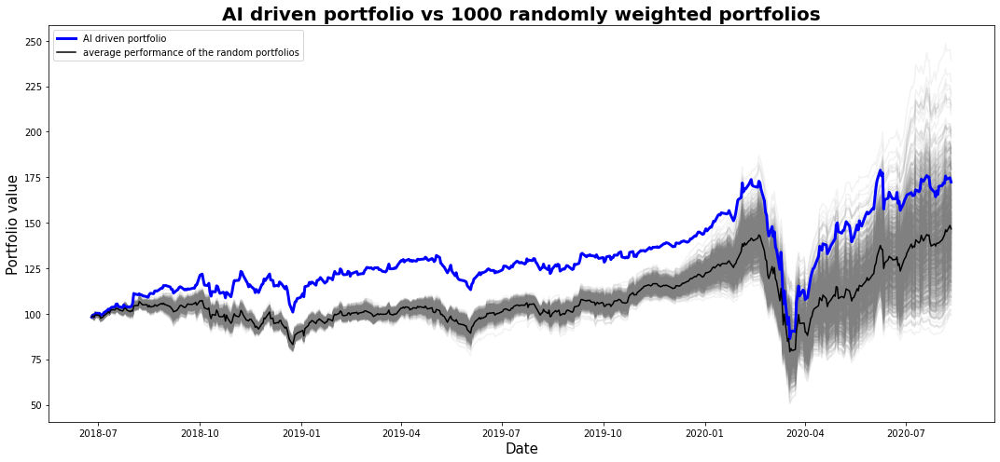

In [116]:
# plotting the time series of the AI driven portfolio (blue) and the 1000 random portfolios (gray)
# moreover, the average performance of the random portfolios is plotted
plt.figure(figsize = (15,7))
plt.title("AI driven portfolio vs 1000 randomly weighted portfolios", weight = "bold", fontsize = 20)
plt.plot(X_test.index[1:], np.array(d_w.reset_index(drop = True)), color = "grey", alpha = 0.1)
plt.plot(X_test.index[1:], np.array(value_time_series_no_w)[1:], lw = 3, color = "blue", label = "AI driven portfolio")
plt.plot(X_test.index[1:], d_w.mean(axis = 1), color = "black", alpha = 1, zorder = 10, label = "average performance of the random portfolios")
plt.ylabel("Portfolio value", fontsize = 15)
plt.xlabel("Date", fontsize = 15)
plt.legend()
plt.tight_layout()

As it can be seen from the chart above, the AI driven portfolio (in blue) constantly outperforms the random portfolios (in grey). The difference in the performance is more evident in the first part of the time horizon. After covid emergency, in fact, there are few random portfolios that were able to beat the AI driven one. However, the AI driven portfolio performs constantly better than the average performance of the random portfolios (in black), during the whole period. This means that the rebalancing strategy is beneficial for the investor.

## 4.3 Imagine that you now pay  <font color='#00807f'> trading fees </font>: 3% of the amount invested is charged for every transaction, what is the new performance of your AI-driven portfolio ?
-  You want to sell 50\\$ of stock A to buy the same amount of stock B, you will becharged 1.5\\$, so you’ll end up with only 48.5$ invested in stock B.

As a final step, we want to check the AI portfolio performance if a fee is applied. We visualize the differences when there is a 3% and a 1% fee. As in the case with no fees, we plot the performance of the AI driven portfolio, ranging the number of optimal stocks from 1 to 8. Please see the comment of the outputs below.

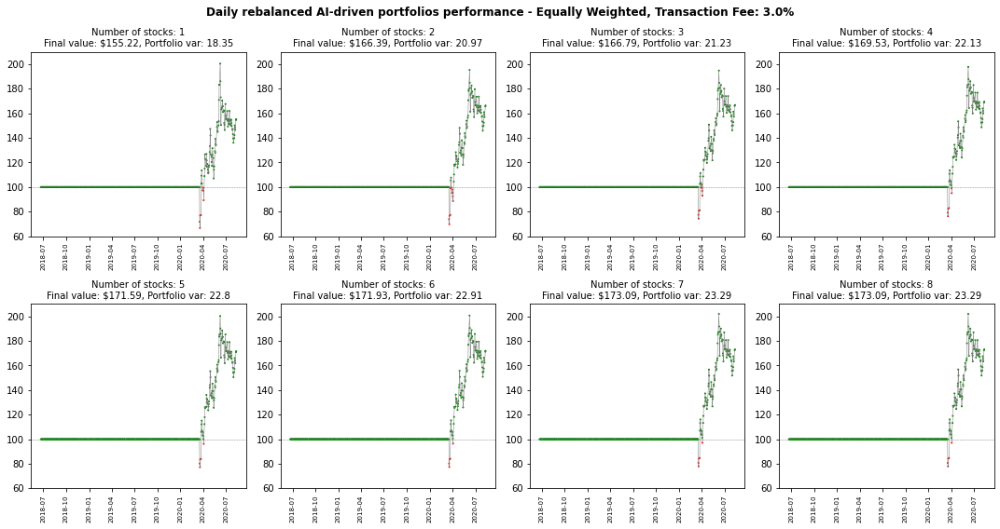

In [117]:
transaction_fee = 0.03 # 3% fee
d_top = {}
colors_top = []

for top_n in range(1,9):
    value = 100
    rets = []
    value_time_series = []
    value_time_series = AI_driven_pf(top_n, weighted = True, fees = transaction_fee, shorting = False)
    
    colors_top.append(['red' if x < 100 else 'green' for x in np.array(value_time_series)])
    d_top[top_n] = value_time_series
    
plt.figure(figsize=(15,8))
plt.suptitle(f"Daily rebalanced AI-driven portfolios performance - Equally Weighted, Transaction Fee: {np.round(transaction_fee*100,1)}%", weight = "bold")
for i in range(1,len(tickers)+1):
    plt.subplot(2,4,i)
    value_time_series = d_top[i]
    plt.plot(X_test.index,value_time_series,color='grey',lw=0.5)
    plt.xticks(rotation = "vertical",size=7)
    plt.scatter(X_test.index,value_time_series,color=colors_top[i-1],s=1)
    plt.axhline(100,lw=0.5,color='grey',zorder=-100,ls='dashed')
    plt.title(f"Number of stocks: {i}\nFinal value: ${np.round(value_time_series[-1],2)}, Portfolio var: {np.round(np.std(value_time_series),2)}", fontsize = 10)
    plt.ylim(60,210)
    
plt.tight_layout()

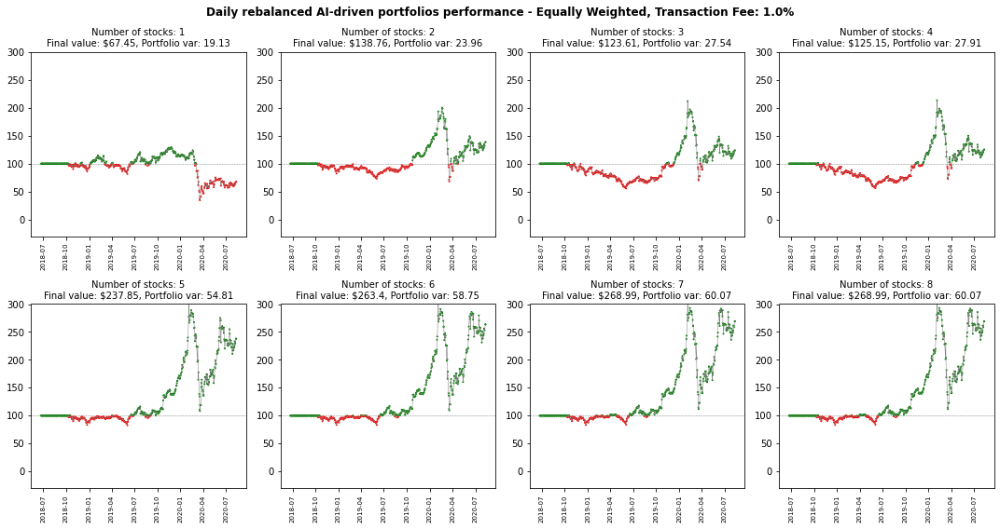

In [118]:
transaction_fee = 0.01 # 1% fee
d_top = {}
colors_top = []

for top_n in range(1,9):
    value = 100
    rets = []
    value_time_series = []
    value_time_series = AI_driven_pf(top_n, weighted = True, fees = transaction_fee, shorting = False)
    
    colors_top.append(['red' if x < 100 else 'green' for x in np.array(value_time_series)])
    d_top[top_n] = value_time_series
    
plt.figure(figsize=(15,8))
plt.suptitle(f"Daily rebalanced AI-driven portfolios performance - Equally Weighted, Transaction Fee: {np.round(transaction_fee*100,1)}%", weight = "bold")
for i in range(1,len(tickers)+1):
    plt.subplot(2,4,i)
    value_time_series = d_top[i]
    plt.plot(X_test.index,value_time_series,color='grey',lw=0.5)
    plt.xticks(rotation = "vertical",size=7)
    plt.scatter(X_test.index,value_time_series,color=colors_top[i-1],s=1)
    plt.axhline(100,lw=0.5,color='grey',zorder=-100,ls='dashed')
    plt.title(f"Number of stocks: {i}\nFinal value: ${np.round(value_time_series[-1],2)}, Portfolio var: {np.round(np.std(value_time_series),2)}", fontsize = 10)
    plt.ylim(-30,300)
    
plt.tight_layout()

Introducing a transaction fee has an interesting effect:  assuming no stocks are owned at the beginning of the test period, because constituting a portfolio requires buying stocks in the first place, fees would need be paid to open the position. So the algorithm automatically computes the expected return of its potential portfolio and then considers whether it is expected to repay for the fees in the following trading day. As a consequence, the higher the fee, the higher the portfolio expected return required for the algorithm to invest and ultimately the longer the time before the first position is opened. This is shown on the plots where the value remains at its initial value of 100 for several days, and this time is increasing in the fee.
In the following days, usually the changes to the portfolio allocation suggested by the algorithm are smaller, allowing for a more flexible reallocation in the weights.
This particularly cautious approach leads to surprisingly good results over the test period.

## EXTRA - optimization problem

Example of method to find stocks weights allocation given a trnasaction fee, framed as an optimization problem.

In [ ]:
import numpy as np
from scipy.optimize import minimize

def gini_normalized(f):
    g = 1 - np.sum(f**2)
    s = len(f)
    return (s*g) / (s-1)

gini_normalized(np.array([0.25,0.25,0.25,0.25]))


wt = np.array([0.25, 0.25, 0.25, 0.25]) # starting weights
vt = 100 # total capital invested
erT = np.array([0.3,0.005,0.1,0.06]) # predicted returns
f = 0.01 # transaction fee
lambda_ = 10 # hyper parameter

def fun(wT, args = (wt, vt, erT, f, lambda_)):
    """
    Computing the loss function to minimize.
    Accounts for an eventual transaction fee f and includes a hyperparameter lambda_ to induce diversification. 
    """
    a = wT-wt
    return - (vt *( 1 + np.dot(wT, erT) ) - vt * np.sum(a[a>0])*f + lambda_ * gini_normalized(wT))

def sum_one(wT):
    return np.sum(wT) - 1

weights = minimize(fun, # function to minimize
                   bounds = ((0,1),(0,1),(0,1), (0,1)), # bounding weights
                    x0 = np.ones(4)/4, # initializing a first guess
                    constraints=({"type":"eq", "fun":sum_one} # constraint
                    )).x

np.round(weights,5)